# Introduction to Deep Learning

## A Comprehensive Guide to Neural Networks with TensorFlow and Keras

---

### What You'll Learn

This notebook is a complete guide to deep learning, combining three major topics:

1. **Part 1: Neural Networks with Keras** - Building your first neural networks
2. **Part 2: Training Deep Neural Networks** - Advanced training techniques
3. **Part 3: Custom Models with TensorFlow** - Building custom architectures

### Prerequisites

- Basic Python programming
- Understanding of NumPy and Pandas
- Basic knowledge of machine learning concepts

### How to Use This Notebook

- Read the markdown explanations carefully
- Run each code cell sequentially
- Experiment with the parameters to see how they affect results
- All code is commented for clarity

---

## 📋 Table of Contents

### Part 1: Neural Networks with Keras Fundamentals
- 1.1 Setup and Imports
- 1.2 Understanding Perceptrons
- 1.3 Activation Functions
- 1.4 Building Image Classifiers
- 1.5 Regression with Neural Networks
- 1.6 Callbacks and Model Checkpointing
- 1.7 TensorBoard Visualization

### Part 2: Training Deep Neural Networks
- 2.1 Vanishing and Exploding Gradients
- 2.2 Weight Initialization Strategies
- 2.3 Advanced Activation Functions
- 2.4 Batch Normalization
- 2.5 Gradient Clipping
- 2.6 Transfer Learning
- 2.7 Regularization Techniques
- 2.8 Optimization Algorithms
- 2.9 Learning Rate Scheduling

### Part 3: Custom Models and Training
- 3.1 TensorFlow Operations and Tensors
- 3.2 Custom Loss Functions
- 3.3 Custom Layers and Models
- 3.4 Custom Training Loops
- 3.5 TensorFlow Functions and Graphs

---

---
# Part 1: Neural Networks with Keras Fundamentals
---

In this first part, we'll learn the fundamentals of building neural networks using Keras, TensorFlow's high-level API. We'll start from the basics and progressively build more complex models.

## What is Keras?

Keras is a high-level neural networks API that makes it easy to build and train deep learning models. It provides:
- Simple, consistent interfaces
- Easy model building with Sequential and Functional APIs
- Built-in support for common layers and activations
- Seamless CPU/GPU execution


## 1.1 Setup and Imports

First, let's import all necessary libraries and set up our environment. We'll be using:
- **TensorFlow/Keras**: For building neural networks
- **NumPy**: For numerical operations
- **Matplotlib**: For visualization
- **Scikit-learn**: For datasets and utilities


In [61]:
import numpy as np
import keras
from keras import layers
from keras import ops

inputs = keras.Input(shape=(784,))

# Just for demonstration purposes.
img_inputs = keras.Input(shape=(32, 32, 3))

inputs.shape

inputs.dtype

dense = layers.Dense(64, activation="relu")
x = dense(inputs)

x = layers.Dense(64, activation="relu")(x)
outputs = layers.Dense(10)(x)

model = keras.Model(inputs=inputs, outputs=outputs, name="mnist_model")

model.summary()

Model: "mnist_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │        50,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 55,050 (215.04 KB)

 Trainable params: 55,050 (215.04 KB)

 Non-trainable params: 0 (0.00 B)

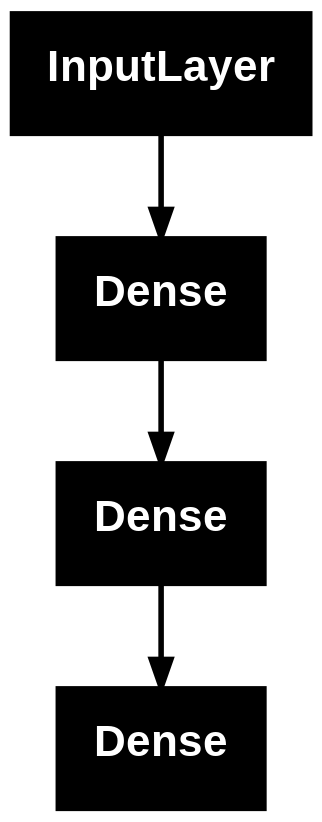

In [62]:
keras.utils.plot_model(model, "my_first_model.png")

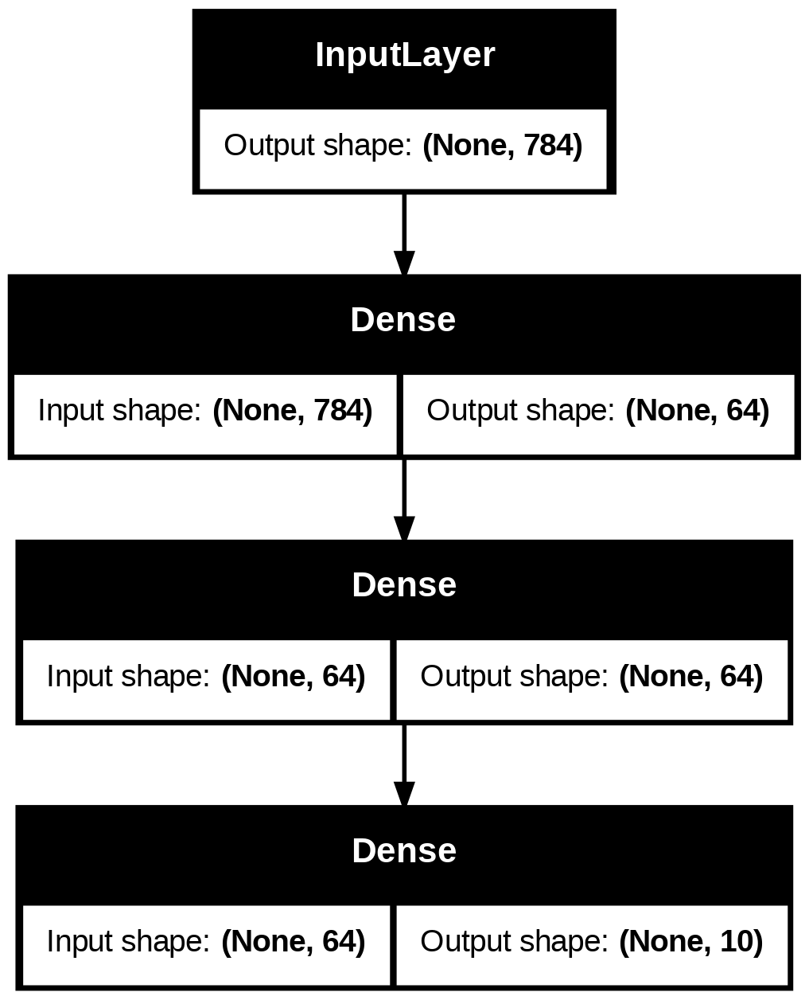

In [63]:
keras.utils.plot_model(model, "my_first_model_with_shape_info.png", show_shapes=True)

In [64]:
# ==============================================================================
# LIBRARY IMPORTS
# ==============================================================================
# We import all necessary libraries for deep learning, data processing, and visualization

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

# TensorFlow ≥2.0 is required
import tensorflow as tf
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "ann"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)


Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


## 1.2 Understanding Perceptrons - The Building Blocks

### What is a Perceptron?

A perceptron is the simplest form of a neural network - a single artificial neuron. It takes multiple inputs, applies weights to them, sums them up, and passes the result through an activation function to produce an output.

**Key Components:**
1. **Inputs (x)**: The features from our data
2. **Weights (w)**: Learned parameters that determine importance of each input
3. **Bias (b)**: An offset term to shift the decision boundary
4. **Activation Function**: Introduces non-linearity

**Mathematical Formula:**
```
output = activation(sum(inputs * weights) + bias)
```


**Note**: we set `max_iter` and `tol` explicitly to avoid warnings about the fact that their default value will change in future versions of Scikit-Learn.

In [65]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
import numpy as np
from sklearn.datasets import load_iris
from sklearn.linear_model import Perceptron

iris = load_iris()
X = iris.data[:, (2, 3)]  # petal length, petal width
y = (iris.target == 0).astype(int) # Changed np.int to int

per_clf = Perceptron(max_iter=1000, tol=1e-3, random_state=42)
per_clf.fit(X, y)

y_pred = per_clf.predict([[2, 0.5]])

In [66]:
y_pred

array([1])

Saving figure perceptron_iris_plot


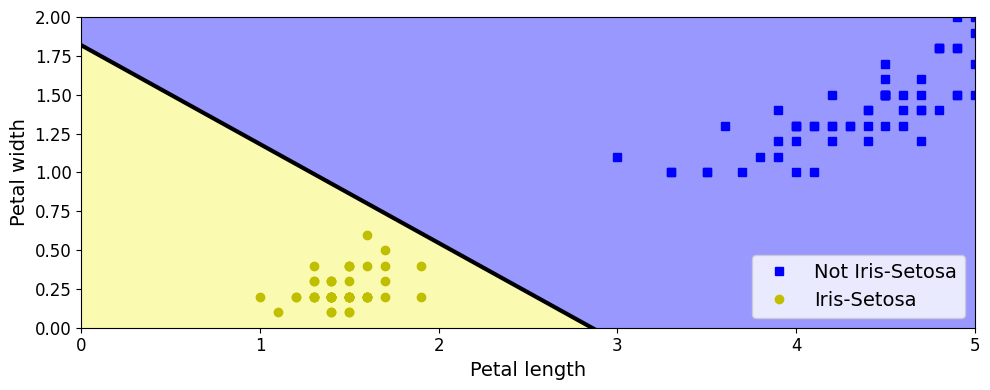

In [67]:
# ===========================================================================
# MODEL EVALUATION
# ===========================================================================
a = -per_clf.coef_[0][0] / per_clf.coef_[0][1]
b = -per_clf.intercept_ / per_clf.coef_[0][1]

axes = [0, 5, 0, 2]

x0, x1 = np.meshgrid(
        np.linspace(axes[0], axes[1], 500).reshape(-1, 1),
        np.linspace(axes[2], axes[3], 200).reshape(-1, 1),
    )
X_new = np.c_[x0.ravel(), x1.ravel()]
y_predict = per_clf.predict(X_new)
zz = y_predict.reshape(x0.shape)

plt.figure(figsize=(10, 4))
plt.plot(X[y==0, 0], X[y==0, 1], "bs", label="Not Iris-Setosa")
plt.plot(X[y==1, 0], X[y==1, 1], "yo", label="Iris-Setosa")

plt.plot([axes[0], axes[1]], [a * axes[0] + b, a * axes[1] + b], "k-", linewidth=3)
from matplotlib.colors import ListedColormap
custom_cmap = ListedColormap(['#9898ff', '#fafab0'])

plt.contourf(x0, x1, zz, cmap=custom_cmap)
plt.xlabel("Petal length", fontsize=14)
plt.ylabel("Petal width", fontsize=14)
plt.legend(loc="lower right", fontsize=14)
plt.axis(axes)

save_fig("perceptron_iris_plot")
plt.show()

## 1.3 Activation Functions - Adding Non-Linearity

### Why Do We Need Activation Functions?

Without activation functions, a neural network would just be a linear model, no matter how many layers it has. Activation functions introduce non-linearity, allowing networks to learn complex patterns.

### Common Activation Functions:

1. **ReLU (Rectified Linear Unit)**: `f(x) = max(0, x)`
   - Most popular for hidden layers
   - Fast to compute
   - Helps avoid vanishing gradients

2. **Sigmoid**: `f(x) = 1 / (1 + e^(-x))`
   - Outputs between 0 and 1
   - Used for binary classification

3. **Tanh**: `f(x) = (e^x - e^(-x)) / (e^x + e^(-x))`
   - Outputs between -1 and 1
   - Zero-centered

4. **Softmax**: Used for multi-class classification
   - Converts outputs to probabilities
   - Ensures all outputs sum to 1


In [68]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def relu(z):
    return np.maximum(0, z)

def derivative(f, z, eps=0.000001):
    return (f(z + eps) - f(z - eps))/(2 * eps)

Saving figure activation_functions_plot


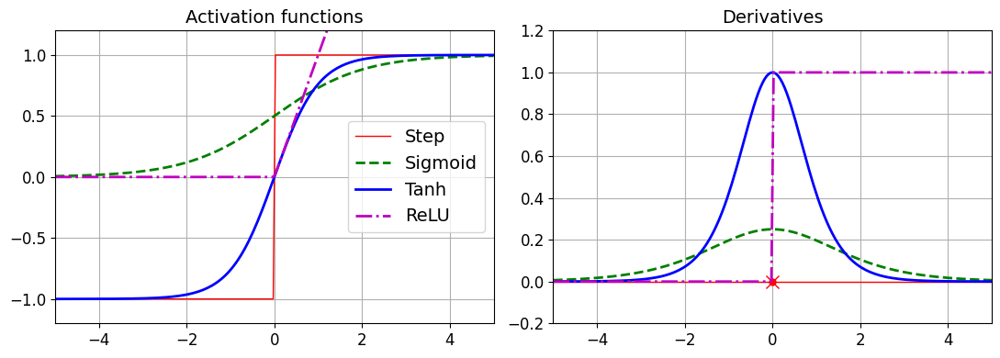

In [69]:
z = np.linspace(-5, 5, 200)

plt.figure(figsize=(11,4))

plt.subplot(121)
plt.plot(z, np.sign(z), "r-", linewidth=1, label="Step")
plt.plot(z, sigmoid(z), "g--", linewidth=2, label="Sigmoid")
plt.plot(z, np.tanh(z), "b-", linewidth=2, label="Tanh")
plt.plot(z, relu(z), "m-.", linewidth=2, label="ReLU")
plt.grid(True)
plt.legend(loc="center right", fontsize=14)
plt.title("Activation functions", fontsize=14)
plt.axis([-5, 5, -1.2, 1.2])

plt.subplot(122)
plt.plot(z, derivative(np.sign, z), "r-", linewidth=1, label="Step")
plt.plot(0, 0, "ro", markersize=5)
plt.plot(0, 0, "rx", markersize=10)
plt.plot(z, derivative(sigmoid, z), "g--", linewidth=2, label="Sigmoid")
plt.plot(z, derivative(np.tanh, z), "b-", linewidth=2, label="Tanh")
plt.plot(z, derivative(relu, z), "m-.", linewidth=2, label="ReLU")
plt.grid(True)
#plt.legend(loc="center right", fontsize=14)
plt.title("Derivatives", fontsize=14)
plt.axis([-5, 5, -0.2, 1.2])

save_fig("activation_functions_plot")
plt.show()

In [70]:
def heaviside(z):
    return (z >= 0).astype(z.dtype)

def mlp_xor(x1, x2, activation=heaviside):
    return activation(-activation(x1 + x2 - 1.5) + activation(x1 + x2 - 0.5) - 0.5)

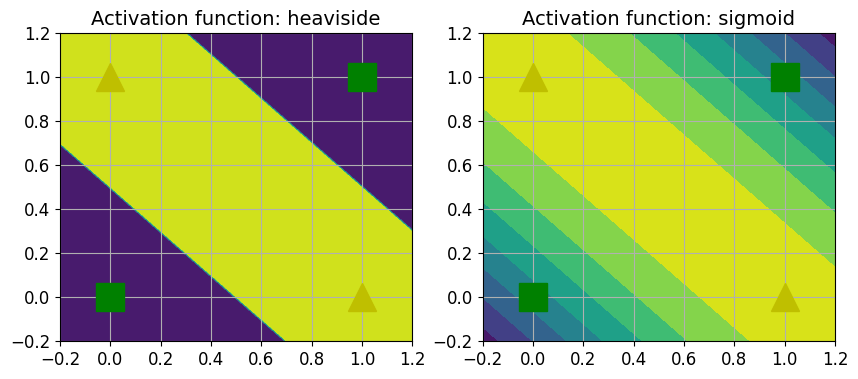

In [71]:
x1s = np.linspace(-0.2, 1.2, 100)
x2s = np.linspace(-0.2, 1.2, 100)
x1, x2 = np.meshgrid(x1s, x2s)

z1 = mlp_xor(x1, x2, activation=heaviside)
z2 = mlp_xor(x1, x2, activation=sigmoid)

plt.figure(figsize=(10,4))

plt.subplot(121)
plt.contourf(x1, x2, z1)
plt.plot([0, 1], [0, 1], "gs", markersize=20)
plt.plot([0, 1], [1, 0], "y^", markersize=20)
plt.title("Activation function: heaviside", fontsize=14)
plt.grid(True)

plt.subplot(122)
plt.contourf(x1, x2, z2)
plt.plot([0, 1], [0, 1], "gs", markersize=20)
plt.plot([0, 1], [1, 0], "y^", markersize=20)
plt.title("Activation function: sigmoid", fontsize=14)
plt.grid(True)

## 1.4 Building an Image Classifier

### Our First Real Neural Network!

Now we'll build a complete image classification system using the Fashion MNIST dataset. This dataset contains 70,000 grayscale images of clothing items in 10 categories.

### Dataset Details:
- **Training images**: 60,000
- **Test images**: 10,000
- **Image size**: 28x28 pixels
- **Classes**: T-shirt, Trouser, Pullover, Dress, Coat, Sandal, Shirt, Sneaker, Bag, Ankle boot

### Steps We'll Follow:
1. Load and explore the data
2. Preprocess the images (normalization)
3. Build the neural network architecture
4. Compile the model (choose optimizer, loss, metrics)
5. Train the model
6. Evaluate performance
7. Make predictions


First let's import TensorFlow and Keras.

In [72]:
import tensorflow as tf
from tensorflow import keras

In [73]:
tf.__version__

'2.19.0'

In [74]:
keras.__version__

'3.10.0'

Let's start by loading the fashion MNIST dataset. Keras has a number of functions to load popular datasets in `keras.datasets`. The dataset is already split for you between a training set and a test set, but it can be useful to split the training set further to have a validation set:

In [75]:
fashion_mnist = keras.datasets.fashion_mnist
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist.load_data()

The training set contains 60,000 grayscale images, each 28x28 pixels:

In [76]:
X_train_full.shape

(60000, 28, 28)

Each pixel intensity is represented as a byte (0 to 255):

In [77]:
X_train_full.dtype

dtype('uint8')

Let's split the full training set into a validation set and a (smaller) training set. We also scale the pixel intensities down to the 0-1 range and convert them to floats, by dividing by 255.

In [78]:
X_valid, X_train = X_train_full[:5000] / 255., X_train_full[5000:] / 255.
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]
X_test = X_test / 255.

You can plot an image using Matplotlib's `imshow()` function, with a `'binary'`
 color map:

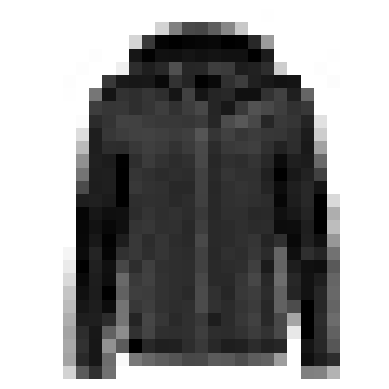

In [79]:
plt.imshow(X_train[0], cmap="binary")
plt.axis('off')
plt.show()

The labels are the class IDs (represented as uint8), from 0 to 9:

In [80]:
y_train

array([4, 0, 7, ..., 3, 0, 5], dtype=uint8)

Here are the corresponding class names:

In [81]:
class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
               "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

So the first image in the training set is a coat:

In [82]:
class_names[y_train[0]]

'Coat'

The validation set contains 5,000 images, and the test set contains 10,000 images:

In [83]:
X_valid.shape

(5000, 28, 28)

In [84]:
X_test.shape

(10000, 28, 28)

Let's take a look at a sample of the images in the dataset:

Saving figure fashion_mnist_plot


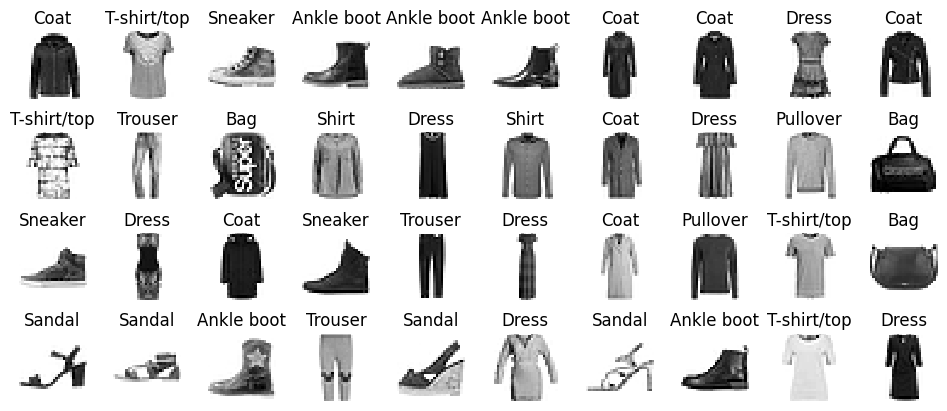

In [85]:
n_rows = 4
n_cols = 10
plt.figure(figsize=(n_cols * 1.2, n_rows * 1.2))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(X_train[index], cmap="binary", interpolation="nearest")
        plt.axis('off')
        plt.title(class_names[y_train[index]], fontsize=12)
plt.subplots_adjust(wspace=0.2, hspace=0.5)
save_fig('fashion_mnist_plot', tight_layout=False)
plt.show()

In [86]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[28, 28]))
model.add(keras.layers.Dense(300, activation="relu"))
model.add(keras.layers.Dense(100, activation="relu"))
model.add(keras.layers.Dense(10, activation="softmax"))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [87]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [88]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="relu"),
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(10, activation="softmax")
])

In [89]:
model.layers

[<Flatten name=flatten, built=True>,
 <Dense name=dense, built=True>,
 <Dense name=dense_1, built=True>,
 <Dense name=dense_2, built=True>]

In [90]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 300)            │       235,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 266,610 (1.02 MB)

 Trainable params: 266,610 (1.02 MB)

 Non-trainable params: 0 (0.00 B)

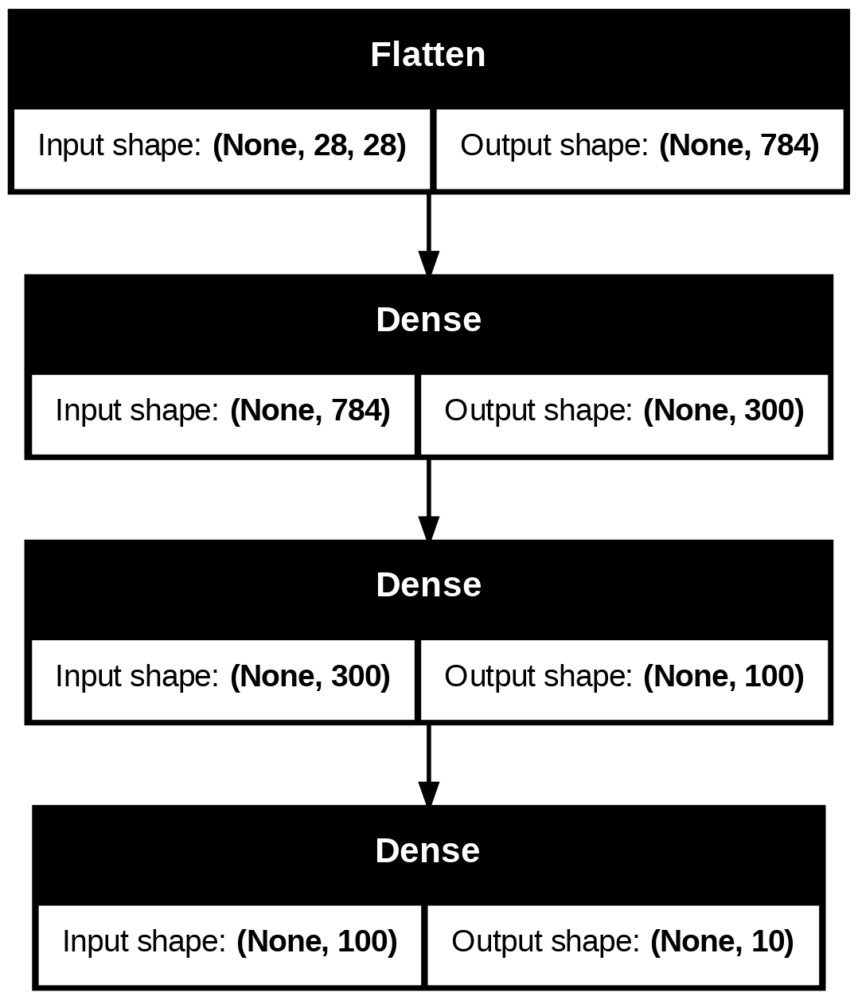

In [91]:
keras.utils.plot_model(model, "my_fashion_mnist_model.png", show_shapes=True)

In [92]:
hidden1 = model.layers[1]
hidden1.name

'dense'

In [93]:
model.get_layer(hidden1.name) is hidden1

True

In [94]:
weights, biases = hidden1.get_weights()

In [95]:
weights

array([[-0.06848605,  0.06931247, -0.05529159, ...,  0.03386871,
        -0.05132751,  0.06180525],
       [-0.04077635, -0.02348944,  0.03655753, ...,  0.07372306,
         0.01156618, -0.01381243],
       [-0.01507546,  0.06605962,  0.07404211, ...,  0.00960732,
         0.07266372,  0.04784114],
       ...,
       [ 0.07030366,  0.0726939 ,  0.01336719, ..., -0.0057752 ,
         0.00540843, -0.03743031],
       [-0.03753598, -0.00267609, -0.06924809, ..., -0.03659534,
        -0.07430575, -0.01714663],
       [-0.02924649, -0.05762073, -0.05735432, ..., -0.06022587,
         0.01104772,  0.06338008]], dtype=float32)

In [96]:
weights.shape

(784, 300)

In [97]:
biases

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [98]:
biases.shape

(300,)

In [99]:
# ===========================================================================
# MODEL COMPILATION
# ===========================================================================
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])

This is equivalent to:

```python
model.compile(loss=keras.losses.sparse_categorical_crossentropy,
              optimizer=keras.optimizers.SGD(),
              metrics=[keras.metrics.sparse_categorical_accuracy])
```

In [100]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
history = model.fit(X_train, y_train, epochs=30,
                    validation_data=(X_valid, y_valid))

Epoch 1/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.6737 - loss: 1.0263 - val_accuracy: 0.8198 - val_loss: 0.5245
Epoch 2/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.8249 - loss: 0.5040 - val_accuracy: 0.8460 - val_loss: 0.4579
Epoch 3/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8414 - loss: 0.4496 - val_accuracy: 0.8548 - val_loss: 0.4248
Epoch 4/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8515 - loss: 0.4190 - val_accuracy: 0.8592 - val_loss: 0.4035
Epoch 5/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8590 - loss: 0.3973 - val_accuracy: 0.8650 - val_loss: 0.3878
Epoch 6/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8648 - loss: 0.3802 - val_accuracy: 0.8676 - val_loss: 0.3760
Epoch 7/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8705 - loss: 0.3663 - val_accuracy: 0.8702 - val_loss: 0.3649
Epoch 8/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8743 - loss: 0.3544 

In [101]:
history.params

{'verbose': 'auto', 'epochs': 30, 'steps': 1719}

In [102]:
print(history.epoch)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


In [103]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

Saving figure keras_learning_curves_plot


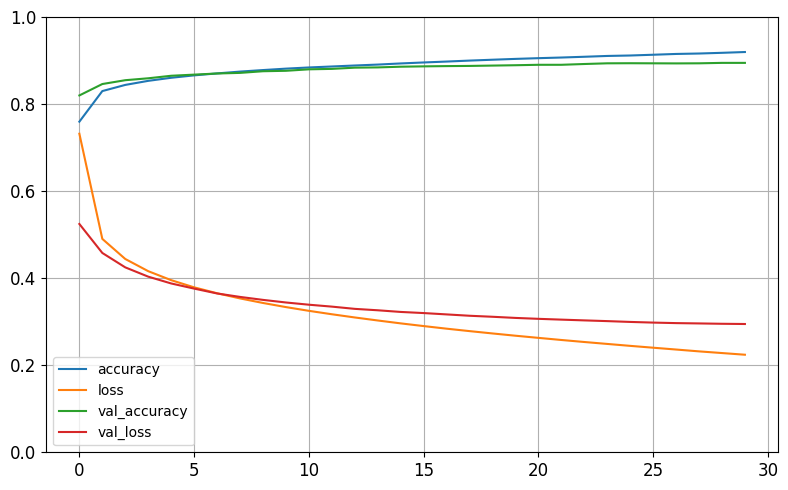

In [104]:
import pandas as pd

pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
save_fig("keras_learning_curves_plot")
plt.show()

In [105]:
# ===========================================================================
# MODEL EVALUATION
# ===========================================================================
model.evaluate(X_test, y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8822 - loss: 0.3316


[0.33202075958251953, 0.8831999897956848]

In [106]:
# ===========================================================================
# MODEL EVALUATION
# ===========================================================================
X_new = X_test[:3]
y_proba = model.predict(X_new)
y_proba.round(2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.02, 0.  , 0.97],
       [0.  , 0.  , 0.99, 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ]],
      dtype=float32)

**Warning**: `model.predict_classes(X_new)` is deprecated. It is replaced with `np.argmax(model.predict(X_new), axis=-1)`.

In [107]:
# ===========================================================================
# MODEL EVALUATION
# ===========================================================================
#y_pred = model.predict_classes(X_new) # deprecated
y_pred = np.argmax(model.predict(X_new), axis=-1)
y_pred

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


array([9, 2, 1])

In [108]:
np.array(class_names)[y_pred]

array(['Ankle boot', 'Pullover', 'Trouser'], dtype='<U11')

In [109]:
y_new = y_test[:3]
y_new

array([9, 2, 1], dtype=uint8)

Saving figure fashion_mnist_images_plot


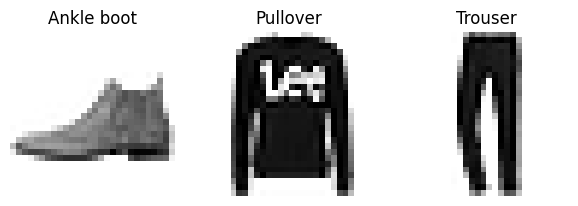

In [110]:
plt.figure(figsize=(7.2, 2.4))
for index, image in enumerate(X_new):
    plt.subplot(1, 3, index + 1)
    plt.imshow(image, cmap="binary", interpolation="nearest")
    plt.axis('off')
    plt.title(class_names[y_test[index]], fontsize=12)
plt.subplots_adjust(wspace=0.2, hspace=0.5)
save_fig('fashion_mnist_images_plot', tight_layout=False)
plt.show()

## 1.5 Regression with Neural Networks

### Classification vs Regression

So far we've focused on classification (predicting categories). Now let's tackle regression (predicting continuous values) using the California Housing dataset.

### Key Differences:
- **Output layer**: Single neuron (instead of multiple)
- **Activation**: Linear or none (instead of softmax/sigmoid)
- **Loss function**: MSE (Mean Squared Error) instead of cross-entropy
- **Metrics**: MAE, RMSE instead of accuracy

### The California Housing Dataset:
Predict median house values based on features like:
- Median income
- House age
- Average rooms
- Population
- Location (latitude/longitude)


Let's load, split and scale the California housing dataset (the original one, not the modified one as in chapter 2):

In [111]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

housing = fetch_california_housing()

X_train_full, X_test, y_train_full, y_test = train_test_split(housing.data, housing.target, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

In [112]:
np.random.seed(42)
tf.random.set_seed(42)

In [113]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape=X_train.shape[1:]),
    keras.layers.Dense(1)
])
model.compile(loss="mean_squared_error", optimizer=keras.optimizers.SGD(learning_rate=1e-3))
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_valid, y_valid))
mse_test = model.evaluate(X_test, y_test)
X_new = X_test[:3]
y_pred = model.predict(X_new)

Epoch 1/20


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 3.8885 - val_loss: 1.4081
Epoch 2/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9260 - val_loss: 0.8363
Epoch 3/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7602 - val_loss: 0.6768
Epoch 4/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.6976 - val_loss: 0.6098
Epoch 5/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.6540 - val_loss: 0.5696
Epoch 6/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6199 - val_loss: 0.5408
Epoch 7/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5921 - val_loss: 0.5185
Epoch 8/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5693 - val_loss: 0.5013
Epoch 9/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5502 - val_loss: 0.4882
Epoch 10/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5342 - val_loss: 0.4785
Epoch 11/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5207 - val_loss: 0.4716
Epoch 12/20
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.

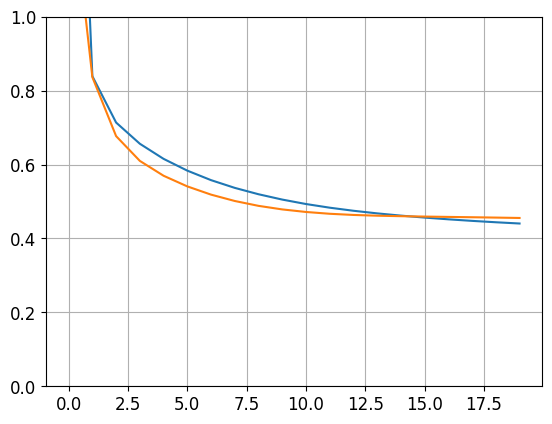

In [114]:
plt.plot(pd.DataFrame(history.history))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [115]:
y_pred

array([[0.59616196],
       [1.7319052 ],
       [3.3179908 ]], dtype=float32)

## 1.6 Callbacks and Model Checkpointing

### What are Callbacks?

Callbacks are functions that are called at certain points during training. They allow you to customize and monitor the training process.

### Common Callbacks:

1. **ModelCheckpoint**: Save the model during training
   - Save best model based on validation performance
   - Prevent losing progress if training crashes

2. **EarlyStopping**: Stop training when improvement stops
   - Monitors a metric (like validation loss)
   - Stops if no improvement for N epochs
   - Helps prevent overfitting

3. **TensorBoard**: Real-time visualization
   - Plot training metrics
   - Visualize model architecture
   - Monitor resource usage

4. **ReduceLROnPlateau**: Adjust learning rate
   - Reduces learning rate when training plateaus
   - Helps fine-tune the model


In [116]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [117]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape=[8]),
    keras.layers.Dense(30, activation="relu"),
    keras.layers.Dense(1)
])

In [118]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model.compile(loss=keras.losses.MeanSquaredError(), optimizer=keras.optimizers.SGD(learning_rate=1e-3))
checkpoint_cb = keras.callbacks.ModelCheckpoint("my_keras_model.h5", save_best_only=True)
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb])
model = keras.models.load_model("my_keras_model.h5") # rollback to best model
mse_test = model.evaluate(X_test, y_test)

Epoch 1/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.9648

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 2.9620 - val_loss: 0.9689
Epoch 2/10
350/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9262

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9231 - val_loss: 0.7498
Epoch 3/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8069

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.8067 - val_loss: 0.6902
Epoch 4/10
363/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7466

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7465 - val_loss: 0.6460
Epoch 5/10
360/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7020

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7015 - val_loss: 0.6093
Epoch 6/10
352/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6662

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6647 - val_loss: 0.5775
Epoch 7/10
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6354

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6332 - val_loss: 0.5498
Epoch 8/10
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6073

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6054 - val_loss: 0.5264
Epoch 9/10
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5829

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5809 - val_loss: 0.5050
Epoch 10/10
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5609

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5592 - val_loss: 0.4868


162/162 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5091


In [119]:
# ===========================================================================
# MODEL COMPILATION
# ===========================================================================
model.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1e-3))
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=100,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb, early_stopping_cb])
mse_test = model.evaluate(X_test, y_test)

Epoch 1/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5400

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.5399 - val_loss: 0.4726
Epoch 2/100
350/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5239

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5228 - val_loss: 0.4624
Epoch 3/100
337/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5099

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5076 - val_loss: 0.4546
Epoch 4/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4954

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4941 - val_loss: 0.4504
Epoch 5/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4834

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4822 - val_loss: 0.4470
Epoch 6/100
356/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4721

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4716 - val_loss: 0.4434
Epoch 7/100
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4627

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4621 - val_loss: 0.4402
Epoch 8/100
358/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4541

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4537 - val_loss: 0.4371
Epoch 9/100
343/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4476

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4463 - val_loss: 0.4341
Epoch 10/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4406

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4397 - val_loss: 0.4309
Epoch 11/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4347

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4338 - val_loss: 0.4276
Epoch 12/100
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4297

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4286 - val_loss: 0.4241
Epoch 13/100
352/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4247

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.4241 - val_loss: 0.4206
Epoch 14/100
354/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4205

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.4201 - val_loss: 0.4171
Epoch 15/100
344/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4175

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4165 - val_loss: 0.4137
Epoch 16/100
353/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4138

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4133 - val_loss: 0.4106
Epoch 17/100
354/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4108

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4103 - val_loss: 0.4079
Epoch 18/100
353/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4082

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4077 - val_loss: 0.4065
Epoch 19/100
342/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4062

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4051 - val_loss: 0.4035
Epoch 20/100
342/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4038

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4027 - val_loss: 0.4009
Epoch 21/100
339/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4017

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4005 - val_loss: 0.3983
Epoch 22/100
340/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3996

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3984 - val_loss: 0.3954
Epoch 23/100
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3968

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3965 - val_loss: 0.3934
Epoch 24/100
337/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3959

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3946 - val_loss: 0.3922
Epoch 25/100
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3932

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3928 - val_loss: 0.3917
Epoch 26/100
357/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3915

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3912 - val_loss: 0.3915
Epoch 27/100
341/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3906

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3896 - val_loss: 0.3912
Epoch 28/100
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3886

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3880 - val_loss: 0.3907
Epoch 29/100
354/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3870

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3866 - val_loss: 0.3907
Epoch 30/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3859

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3852 - val_loss: 0.3902
Epoch 31/100
343/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3848

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3839 - val_loss: 0.3897
Epoch 32/100
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3832

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3826 - val_loss: 0.3895
Epoch 33/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3821

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3814 - val_loss: 0.3889
Epoch 34/100
361/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3804

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3803 - val_loss: 0.3887
Epoch 35/100
358/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3794

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3792 - val_loss: 0.3885
Epoch 36/100
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3789

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3781 - val_loss: 0.3882
Epoch 37/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3778

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3771 - val_loss: 0.3880
Epoch 38/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3761 - val_loss: 0.3880
Epoch 39/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3758

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3751 - val_loss: 0.3876
Epoch 40/100
344/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3751

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3742 - val_loss: 0.3870
Epoch 41/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3739

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3733 - val_loss: 0.3867
Epoch 42/100
353/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3729

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3725 - val_loss: 0.3859
Epoch 43/100
353/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3721

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3716 - val_loss: 0.3857
Epoch 44/100
344/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3717

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3708 - val_loss: 0.3851
Epoch 45/100
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3706

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3700 - val_loss: 0.3848
Epoch 46/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3699

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3693 - val_loss: 0.3842
Epoch 47/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3686

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3685 - val_loss: 0.3837
Epoch 48/100
348/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3684

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3678 - val_loss: 0.3835
Epoch 49/100
342/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3680

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3671 - val_loss: 0.3831
Epoch 50/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3671

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3663 - val_loss: 0.3827
Epoch 51/100
341/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3667

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3656 - val_loss: 0.3816
Epoch 52/100
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3658

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3650 - val_loss: 0.3770
Epoch 53/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3650

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3644 - val_loss: 0.3766
Epoch 54/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3638

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3637 - val_loss: 0.3759
Epoch 55/100
362/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3632

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3631 - val_loss: 0.3756
Epoch 56/100
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3632

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3625 - val_loss: 0.3755
Epoch 57/100
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3626

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3618 - val_loss: 0.3748
Epoch 58/100
360/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3613

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3612 - val_loss: 0.3737
Epoch 59/100
350/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3612

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3606 - val_loss: 0.3696
Epoch 60/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3599 - val_loss: 0.3698
Epoch 61/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3592 - val_loss: 0.3713
Epoch 62/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3586 - val_loss: 0.3730
Epoch 63/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3580 - val_loss: 0.3745
Epoch 64/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3574 - val_loss: 0.3723
Epoch 65/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3567 - val_loss: 0.3706
Epoch 66/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3561 - val_loss: 0.3706
Epoch 67/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3555 - val_loss: 0.3721
Epoch 68/100
345/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3557

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3549 - val_loss: 0.3695
Epoch 69/100
344/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3552

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3543 - val_loss: 0.3683
Epoch 70/100
339/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3549

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3538 - val_loss: 0.3672
Epoch 71/100
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3536

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3532 - val_loss: 0.3654
Epoch 72/100
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3535

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3527 - val_loss: 0.3643
Epoch 73/100
353/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3526

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3522 - val_loss: 0.3625
Epoch 74/100
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3520

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3516 - val_loss: 0.3615
Epoch 75/100
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3511 - val_loss: 0.3627
Epoch 76/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3512

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3506 - val_loss: 0.3597
Epoch 77/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3507

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3501 - val_loss: 0.3582
Epoch 78/100
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3502

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3496 - val_loss: 0.3569
Epoch 79/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3498

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3491 - val_loss: 0.3549
Epoch 80/100
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3492

363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3486 - val_loss: 0.3539
Epoch 81/100
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3489

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3482 - val_loss: 0.3523
Epoch 82/100
350/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3482

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3477 - val_loss: 0.3513
Epoch 83/100
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3479

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3472 - val_loss: 0.3499
Epoch 84/100
343/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3476

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3467 - val_loss: 0.3492
Epoch 85/100
344/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3471

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3462 - val_loss: 0.3476
Epoch 86/100
346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3465

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3458 - val_loss: 0.3471
Epoch 87/100
354/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3457

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3453 - val_loss: 0.3460
Epoch 88/100
341/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3458

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3448 - val_loss: 0.3453
Epoch 89/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3450

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3444 - val_loss: 0.3444
Epoch 90/100
347/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3446

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3439 - val_loss: 0.3431
Epoch 91/100
359/363 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3437

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3435 - val_loss: 0.3425
Epoch 92/100
360/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3432

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3431 - val_loss: 0.3411
Epoch 93/100
340/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3437

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3426 - val_loss: 0.3402
Epoch 94/100
360/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3423

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3422 - val_loss: 0.3397
Epoch 95/100
338/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3429

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3417 - val_loss: 0.3383
Epoch 96/100
342/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3423

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3413 - val_loss: 0.3373
Epoch 97/100
361/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3411

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3409 - val_loss: 0.3371
Epoch 98/100
341/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3415

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3405 - val_loss: 0.3366
Epoch 99/100
343/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3410

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3401 - val_loss: 0.3356
Epoch 100/100
349/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3403

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3397 - val_loss: 0.3352
162/162 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3355


In [120]:
class PrintValTrainRatioCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        print("\nval/train: {:.2f}".format(logs["val_loss"] / logs["loss"]))

In [121]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
val_train_ratio_cb = PrintValTrainRatioCallback()
history = model.fit(X_train, y_train, epochs=1,
                    validation_data=(X_valid, y_valid),
                    callbacks=[val_train_ratio_cb])

346/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3401
val/train: 1.03
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3393 - val_loss: 0.3349


## 1.7 TensorBoard - Visualizing Training

### What is TensorBoard?

TensorBoard is TensorFlow's visualization toolkit. It provides:
- Real-time plots of training/validation metrics
- Model graph visualization
- Histogram of weights and biases
- Profiling information

### How to Use TensorBoard:
1. Add TensorBoard callback during training
2. Run TensorBoard server: `tensorboard --logdir=./logs`
3. Open browser to `localhost:6006`

### Benefits:
- Quickly identify overfitting
- Compare different model configurations
- Debug training issues
- Share results with team


In [122]:
root_logdir = os.path.join(os.curdir, "my_logs")

In [123]:
def get_run_logdir():
    import time
    run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()
run_logdir

'./my_logs/run_2026_02_22-08_32_07'

In [124]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [125]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape=[8]),
    keras.layers.Dense(30, activation="relu"),
    keras.layers.Dense(1)
])
model.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1e-3))

In [126]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
history = model.fit(X_train, y_train, epochs=30,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb, tensorboard_cb])

Epoch 1/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 4.2653 - val_loss: 1.1114
Epoch 2/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9900 - val_loss: 0.8047
Epoch 3/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7197 - val_loss: 0.7243
Epoch 4/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6421 - val_loss: 0.6415
Epoch 5/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6038 - val_loss: 0.5844
Epoch 6/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5761 - val_loss: 0.5430
Epoch 7/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5526 - val_loss: 0.5103
Epoch 8/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.5320 - val_loss: 0.4831
Epoch 9/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5130 - val_loss: 0.4598
Epoch 10/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4971 - val_loss: 0.4418
Epoch 11/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4833 - val_loss: 0.4258
Epoch 12/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

To start the TensorBoard server, one option is to open a terminal, if needed activate the virtualenv where you installed TensorBoard, go to this notebook's directory, then type:

```bash
$ tensorboard --logdir=./my_logs --port=6006
```

You can then open your web browser to [localhost:6006](http://localhost:6006) and use TensorBoard. Once you are done, press Ctrl-C in the terminal window, this will shutdown the TensorBoard server.

Alternatively, you can load TensorBoard's Jupyter extension and run it like this:

In [127]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

Output hidden; open in https://colab.research.google.com to view.

In [128]:
run_logdir2 = get_run_logdir()
run_logdir2

'./my_logs/run_2026_02_22-08_32_55'

In [129]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [130]:
# ===========================================================================
# MODEL DEFINITION
# ===========================================================================
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape=[8]),
    keras.layers.Dense(30, activation="relu"),
    keras.layers.Dense(1)
])
model.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=0.05))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [131]:
# ===========================================================================
# MODEL TRAINING
# ===========================================================================
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir2)
history = model.fit(X_train, y_train, epochs=30,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb, tensorboard_cb])

Epoch 1/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.7397 - val_loss: 0.3803
Epoch 2/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4206 - val_loss: 0.4645
Epoch 3/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4052 - val_loss: 0.5799
Epoch 4/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3866 - val_loss: 0.6100
Epoch 5/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3810 - val_loss: 0.9303
Epoch 6/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3701 - val_loss: 0.4935
Epoch 7/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3584 - val_loss: 0.3457
Epoch 8/30
356/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3481

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3477 - val_loss: 0.3265
Epoch 9/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3429 - val_loss: 0.3500
Epoch 10/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3367 - val_loss: 0.6245
Epoch 11/30
360/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3321

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3320 - val_loss: 0.3016
Epoch 12/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3279 - val_loss: 0.3060
Epoch 13/30
351/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3235

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3230 - val_loss: 0.2956
Epoch 14/30
355/363 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3195

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3192 - val_loss: 0.2936
Epoch 15/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3148 - val_loss: 0.4631
Epoch 16/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3123 - val_loss: 0.3782
Epoch 17/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3104 - val_loss: 0.3480
Epoch 18/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3052 - val_loss: 0.3370
Epoch 19/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.3018 - val_loss: 0.3412
Epoch 20/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2992 - val_loss: 0.2939
Epoch 21/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2969 - val_loss: 0.3570
Epoch 22/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2975 - val_loss: 0.2958
Epoch 23/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2943 - val_loss: 0.2981
Epoch 24/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2951 - val_loss: 1.0245
Epoch 25/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2867 - val_loss: 0.2868
Epoch 28/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2842 - val_loss: 0.2900
Epoch 29/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2822 - val_loss: 0.2922
Epoch 30/30
363/363 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2814 - val_loss: 0.2907


Notice how TensorBoard now sees two runs, and you can compare the learning curves.

Check out the other available logging options:

In [132]:
help(keras.callbacks.TensorBoard.__init__)

Help on function __init__ in module keras.src.callbacks.tensorboard:

__init__(self, log_dir='logs', histogram_freq=0, write_graph=True, write_images=False, write_steps_per_second=False, update_freq='epoch', profile_batch=0, embeddings_freq=0, embeddings_metadata=None)
    Initialize self.  See help(type(self)) for accurate signature.



---
# Part 2: Training Deep Neural Networks
---

Building a neural network is just the beginning. Training it effectively is where the real challenge lies. In this section, we'll explore advanced techniques that help neural networks learn faster, generalize better, and avoid common pitfalls.

## Challenges in Training Deep Networks:

1. **Vanishing/Exploding Gradients**: Gradients become too small or too large during backpropagation
2. **Overfitting**: Model memorizes training data instead of learning patterns
3. **Slow Convergence**: Training takes too long to reach good performance
4. **Poor Generalization**: Model doesn't work well on new data

## Solutions We'll Learn:

- Better initialization strategies
- Advanced activation functions
- Batch normalization
- Regularization techniques (Dropout, L1/L2)
- Optimized learning algorithms
- Learning rate scheduling
- Transfer learning


## 2.1 The Vanishing and Exploding Gradients Problem

### What is This Problem?

During backpropagation, gradients are computed from the output layer back to the input layer using the chain rule. In deep networks:

- **Vanishing Gradients**: Gradients get multiplied by values < 1 repeatedly, becoming extremely small
  - Early layers learn very slowly or not at all
  - Common with sigmoid/tanh activations
  
- **Exploding Gradients**: Gradients get multiplied by values > 1 repeatedly, becoming extremely large
  - Weights update too drastically
  - Training becomes unstable
  - Can cause NaN values

### Why Does This Happen?

Consider a network with 100 layers. If each layer's gradient is 0.9:
```
0.9^100 ≈ 0.00003 (vanishes!)
```

If each layer's gradient is 1.1:
```
1.1^100 ≈ 13,780 (explodes!)
```

### Solutions:
1. Better weight initialization (Xavier, He)
2. Better activation functions (ReLU family)
3. Batch Normalization
4. Gradient Clipping
5. Residual connections (ResNet)


## 2.2 Weight Initialization Strategies

### Why is Initialization Important?

The initial weights of a neural network significantly affect:
- Training speed
- Whether training converges at all
- Final model performance

### Bad Initialization:
- **All zeros**: All neurons learn the same thing (symmetry problem)
- **Too large**: Exploding gradients
- **Too small**: Vanishing gradients

### Good Initialization Strategies:

**1. Xavier (Glorot) Initialization:**
- For sigmoid/tanh activation functions
- Variance = 2 / (fan_in + fan_out)
- Keeps signal variance constant through layers

**2. He Initialization:**
- For ReLU activation functions
- Variance = 2 / fan_in
- Accounts for ReLU killing half the neurons

**3. LeCun Initialization:**
- For SELU activation
- Variance = 1 / fan_in


In [133]:
[name for name in dir(keras.initializers) if not name.startswith("_")]

['Constant',
 'GlorotNormal',
 'GlorotUniform',
 'HeNormal',
 'HeUniform',
 'Identity',
 'IdentityInitializer',
 'Initializer',
 'LecunNormal',
 'LecunUniform',
 'Ones',
 'Orthogonal',
 'OrthogonalInitializer',
 'RandomNormal',
 'RandomUniform',
 'STFT',
 'STFTInitializer',
 'TruncatedNormal',
 'VarianceScaling',
 'Zeros',
 'constant',
 'deserialize',
 'get',
 'glorot_normal',
 'glorot_uniform',
 'he_normal',
 'he_uniform',
 'identity',
 'lecun_normal',
 'lecun_uniform',
 'ones',
 'orthogonal',
 'random_normal',
 'random_uniform',
 'serialize',
 'stft',
 'truncated_normal',
 'variance_scaling',
 'zeros']

In [134]:
keras.layers.Dense(10, activation="relu", kernel_initializer="he_normal")

<Dense name=dense_3, built=False>

In [135]:
init = keras.initializers.VarianceScaling(scale=2., mode='fan_avg',
                                          distribution='uniform')
keras.layers.Dense(10, activation="relu", kernel_initializer=init)

<Dense name=dense_4, built=False>

## Nonsaturating Activation Functions

## 2.3 Advanced Activation Functions

### Beyond Basic ReLU

While ReLU is popular, it has a problem: **dying ReLU**. When a neuron's output is negative, ReLU outputs zero, and the gradient is also zero. If this happens to many neurons, they can't learn.

### Advanced Variants:

**1. Leaky ReLU:**
```
f(x) = max(αx, x) where α is small (e.g., 0.01)
```
- Allows small gradient when x < 0
- Prevents dying ReLU problem

**2. PReLU (Parametric ReLU):**
- α is a learnable parameter
- Network learns the best slope

**3. ELU (Exponential Linear Unit):**
```
f(x) = x if x > 0 else α(e^x - 1)
```
- Smooth, helps gradients flow better
- Mean output closer to zero

**4. SELU (Scaled ELU):**
- Self-normalizing properties
- Works best with specific initialization

**5. GELU (Gaussian Error Linear Unit):**
- Used in transformers (BERT, GPT)
- Smooth, non-monotonic


In [136]:
def leaky_relu(z, alpha=0.01):
    return np.maximum(alpha*z, z)

Saving figure leaky_relu_plot


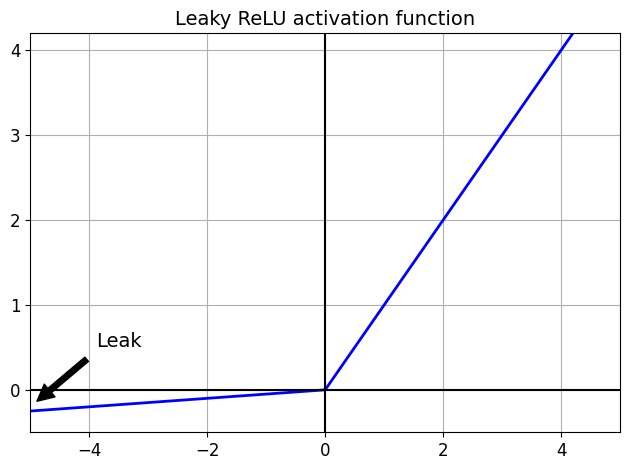

In [137]:
plt.plot(z, leaky_relu(z, 0.05), "b-", linewidth=2)
plt.plot([-5, 5], [0, 0], 'k-')
plt.plot([0, 0], [-0.5, 4.2], 'k-')
plt.grid(True)
props = dict(facecolor='black', shrink=0.1)
plt.annotate('Leak', xytext=(-3.5, 0.5), xy=(-5, -0.2), arrowprops=props, fontsize=14, ha="center")
plt.title("Leaky ReLU activation function", fontsize=14)
plt.axis([-5, 5, -0.5, 4.2])

save_fig("leaky_relu_plot")
plt.show()

In [138]:
[m for m in dir(keras.activations) if not m.startswith("_")]

['celu',
 'deserialize',
 'elu',
 'exponential',
 'gelu',
 'get',
 'glu',
 'hard_shrink',
 'hard_sigmoid',
 'hard_silu',
 'hard_swish',
 'hard_tanh',
 'leaky_relu',
 'linear',
 'log_sigmoid',
 'log_softmax',
 'mish',
 'relu',
 'relu6',
 'selu',
 'serialize',
 'sigmoid',
 'silu',
 'soft_shrink',
 'softmax',
 'softplus',
 'softsign',
 'sparse_plus',
 'sparse_sigmoid',
 'sparsemax',
 'squareplus',
 'swish',
 'tanh',
 'tanh_shrink',
 'threshold']

In [139]:
[m for m in dir(keras.layers) if "relu" in m.lower()]

['LeakyReLU', 'PReLU', 'ReLU', 'ThresholdedReLU']

Let's train a neural network on Fashion MNIST using the Leaky ReLU:

In [140]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full / 255.0
X_test = X_test / 255.0
X_valid, X_train = X_train_full[:5000], X_train_full[5000:]
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]

In [141]:
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, kernel_initializer="he_normal"),
    keras.layers.LeakyReLU(),
    keras.layers.Dense(100, kernel_initializer="he_normal"),
    keras.layers.LeakyReLU(),
    keras.layers.Dense(10, activation="softmax")
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [142]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

In [143]:
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.4906 - loss: 1.6127 - val_accuracy: 0.7156 - val_loss: 0.8613
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7262 - loss: 0.8232 - val_accuracy: 0.7658 - val_loss: 0.7038
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7665 - loss: 0.6950 - val_accuracy: 0.7926 - val_loss: 0.6338
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7889 - loss: 0.6313 - val_accuracy: 0.8046 - val_loss: 0.5906
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8017 - loss: 0.5903 - val_accuracy: 0.8152 - val_loss: 0.5605
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8105 - loss: 0.5612 - val_accuracy: 0.8220 - val_loss: 0.5381
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8180 - loss: 0.5393 - val_accuracy: 0.8262 - val_loss: 0.5209
Epoch 8/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8227 - loss: 0.5221 - 

Now let's try PReLU:

In [144]:
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, kernel_initializer="he_normal"),
    keras.layers.PReLU(),
    keras.layers.Dense(100, kernel_initializer="he_normal"),
    keras.layers.PReLU(),
    keras.layers.Dense(10, activation="softmax")
])

In [145]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

In [146]:
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.5018 - loss: 1.6392 - val_accuracy: 0.7290 - val_loss: 0.8630
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7340 - loss: 0.8256 - val_accuracy: 0.7856 - val_loss: 0.7013
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7793 - loss: 0.6922 - val_accuracy: 0.8062 - val_loss: 0.6268
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7985 - loss: 0.6242 - val_accuracy: 0.8192 - val_loss: 0.5801
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8091 - loss: 0.5808 - val_accuracy: 0.8276 - val_loss: 0.5479
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8167 - loss: 0.5504 - val_accuracy: 0.8314 - val_loss: 0.5243
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8237 - loss: 0.5280 - val_accuracy: 0.8356 - val_loss: 0.5062
Epoch 8/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8280 - loss: 0.5105 - 

### ELU

In [147]:
def elu(z, alpha=1):
    return np.where(z < 0, alpha * (np.exp(z) - 1), z)

Saving figure elu_plot


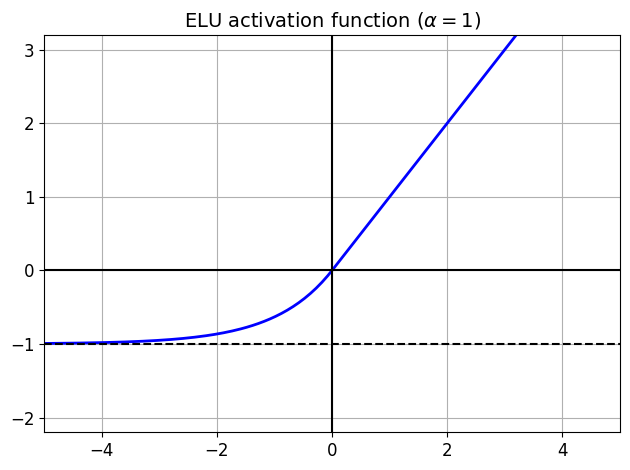

In [148]:
plt.plot(z, elu(z), "b-", linewidth=2)
plt.plot([-5, 5], [0, 0], 'k-')
plt.plot([-5, 5], [-1, -1], 'k--')
plt.plot([0, 0], [-2.2, 3.2], 'k-')
plt.grid(True)
plt.title(r"ELU activation function ($\alpha=1$)", fontsize=14)
plt.axis([-5, 5, -2.2, 3.2])

save_fig("elu_plot")
plt.show()

Implementing ELU in TensorFlow is trivial, just specify the activation function when building each layer:

In [149]:
keras.layers.Dense(10, activation="elu")

<Dense name=dense_11, built=False>

### SELU

This activation function was proposed in this [great paper](https://arxiv.org/pdf/1706.02515.pdf) by Günter Klambauer, Thomas Unterthiner and Andreas Mayr, published in June 2017. During training, a neural network composed exclusively of a stack of dense layers using the SELU activation function and LeCun initialization will self-normalize: the output of each layer will tend to preserve the same mean and variance during training, which solves the vanishing/exploding gradients problem. As a result, this activation function outperforms the other activation functions very significantly for such neural nets, so you should really try it out. Unfortunately, the self-normalizing property of the SELU activation function is easily broken: you cannot use ℓ<sub>1</sub> or ℓ<sub>2</sub> regularization, regular dropout, max-norm, skip connections or other non-sequential topologies (so recurrent neural networks won't self-normalize). However, in practice it works quite well with sequential CNNs. If you break self-normalization, SELU will not necessarily outperform other activation functions.

In [150]:
from scipy.special import erfc

# alpha and scale to self normalize with mean 0 and standard deviation 1
# (see equation 14 in the paper):
alpha_0_1 = -np.sqrt(2 / np.pi) / (erfc(1/np.sqrt(2)) * np.exp(1/2) - 1)
scale_0_1 = (1 - erfc(1 / np.sqrt(2)) * np.sqrt(np.e)) * np.sqrt(2 * np.pi) * (2 * erfc(np.sqrt(2))*np.e**2 + np.pi*erfc(1/np.sqrt(2))**2*np.e - 2*(2+np.pi)*erfc(1/np.sqrt(2))*np.sqrt(np.e)+np.pi+2)**(-1/2)

In [151]:
def selu(z, scale=scale_0_1, alpha=alpha_0_1):
    return scale * elu(z, alpha)

Saving figure selu_plot


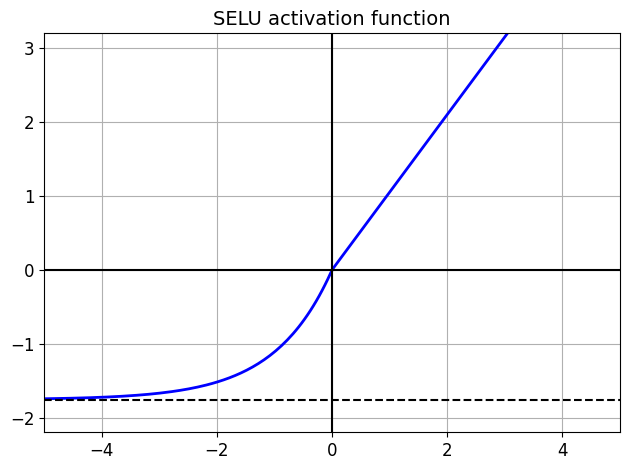

In [152]:
plt.plot(z, selu(z), "b-", linewidth=2)
plt.plot([-5, 5], [0, 0], 'k-')
plt.plot([-5, 5], [-1.758, -1.758], 'k--')
plt.plot([0, 0], [-2.2, 3.2], 'k-')
plt.grid(True)
plt.title("SELU activation function", fontsize=14)
plt.axis([-5, 5, -2.2, 3.2])

save_fig("selu_plot")
plt.show()

By default, the SELU hyperparameters (`scale` and `alpha`) are tuned in such a way that the mean output of each neuron remains close to 0, and the standard deviation remains close to 1 (assuming the inputs are standardized with mean 0 and standard deviation 1 too). Using this activation function, even a 1,000 layer deep neural network preserves roughly mean 0 and standard deviation 1 across all layers, avoiding the exploding/vanishing gradients problem:

In [153]:
np.random.seed(42)
Z = np.random.normal(size=(500, 100)) # standardized inputs
for layer in range(1000):
    W = np.random.normal(size=(100, 100), scale=np.sqrt(1 / 100)) # LeCun initialization
    Z = selu(np.dot(Z, W))
    means = np.mean(Z, axis=0).mean()
    stds = np.std(Z, axis=0).mean()
    if layer % 100 == 0:
        print("Layer {}: mean {:.2f}, std deviation {:.2f}".format(layer, means, stds))

Layer 0: mean -0.00, std deviation 1.00
Layer 100: mean 0.02, std deviation 0.96
Layer 200: mean 0.01, std deviation 0.90
Layer 300: mean -0.02, std deviation 0.92
Layer 400: mean 0.05, std deviation 0.89
Layer 500: mean 0.01, std deviation 0.93
Layer 600: mean 0.02, std deviation 0.92
Layer 700: mean -0.02, std deviation 0.90
Layer 800: mean 0.05, std deviation 0.83
Layer 900: mean 0.02, std deviation 1.00


Using SELU is easy:

In [154]:
keras.layers.Dense(10, activation="selu",
                   kernel_initializer="lecun_normal")

<Dense name=dense_12, built=False>

Let's create a neural net for Fashion MNIST with 100 hidden layers, using the SELU activation function:

In [155]:
np.random.seed(42)
tf.random.set_seed(42)

In [156]:
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[28, 28]))
model.add(keras.layers.Dense(300, activation="selu",
                             kernel_initializer="lecun_normal"))
for layer in range(99):
    model.add(keras.layers.Dense(100, activation="selu",
                                 kernel_initializer="lecun_normal"))
model.add(keras.layers.Dense(10, activation="softmax"))

In [157]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

Now let's train it. Do not forget to scale the inputs to mean 0 and standard deviation 1:

In [158]:
pixel_means = X_train.mean(axis=0, keepdims=True)
pixel_stds = X_train.std(axis=0, keepdims=True)
X_train_scaled = (X_train - pixel_means) / pixel_stds
X_valid_scaled = (X_valid - pixel_means) / pixel_stds
X_test_scaled = (X_test - pixel_means) / pixel_stds

In [159]:
history = model.fit(X_train_scaled, y_train, epochs=5,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 26s 12ms/step - accuracy: 0.4546 - loss: 1.4350 - val_accuracy: 0.7594 - val_loss: 0.7192
Epoch 2/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.7526 - loss: 0.6787 - val_accuracy: 0.7786 - val_loss: 0.6099
Epoch 3/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - accuracy: 0.7830 - loss: 0.5873 - val_accuracy: 0.8004 - val_loss: 0.5508
Epoch 4/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.8074 - loss: 0.5323 - val_accuracy: 0.8194 - val_loss: 0.5038
Epoch 5/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.8268 - loss: 0.4925 - val_accuracy: 0.8356 - val_loss: 0.4742


Now look at what happens if we try to use the ReLU activation function instead:

In [160]:
np.random.seed(42)
tf.random.set_seed(42)

In [161]:
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[28, 28]))
model.add(keras.layers.Dense(300, activation="relu", kernel_initializer="he_normal"))
for layer in range(99):
    model.add(keras.layers.Dense(100, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(10, activation="softmax"))

In [162]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

In [163]:
history = model.fit(X_train_scaled, y_train, epochs=5,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 27s 12ms/step - accuracy: 0.1660 - loss: 2.1297 - val_accuracy: 0.2404 - val_loss: 1.8308
Epoch 2/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.2929 - loss: 1.7475 - val_accuracy: 0.4022 - val_loss: 1.4091
Epoch 3/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.3985 - loss: 1.4051 - val_accuracy: 0.5762 - val_loss: 1.0696
Epoch 4/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.5726 - loss: 1.0839 - val_accuracy: 0.6546 - val_loss: 0.9221
Epoch 5/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - accuracy: 0.6321 - loss: 0.9444 - val_accuracy: 0.4868 - val_loss: 1.4640


Not great at all, we suffered from the vanishing/exploding gradients problem.

## 2.4 Batch Normalization - A Game Changer

### What is Batch Normalization?

Batch Normalization (BatchNorm) normalizes the inputs to each layer, making training faster and more stable.

### How It Works:

For each mini-batch during training:
1. Calculate mean (μ) and variance (σ²) of the inputs
2. Normalize: `x_norm = (x - μ) / sqrt(σ² + ε)`
3. Scale and shift: `y = γ * x_norm + β`
   - γ and β are learnable parameters

### Benefits:

1. **Faster Training**: Can use higher learning rates
2. **Less Sensitive to Initialization**: Reduces dependence on good weight initialization
3. **Regularization Effect**: Acts like dropout, reducing overfitting
4. **Stable Gradients**: Helps avoid vanishing/exploding gradients

### Where to Place BatchNorm:

Typically after the layer, before activation:
```
Dense → BatchNorm → Activation
```

But sometimes after activation works better - experiment!


In [164]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(300, activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(100, activation="relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(10, activation="softmax")
])

In [165]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_4 (Flatten)             │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 784)            │         3,136 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 300)            │       235,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 300)            │         1,200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 100)            │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_217 (Dense)               │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 271,346 (1.04 MB)

 Trainable params: 268,978 (1.03 MB)

 Non-trainable params: 2,368 (9.25 KB)

In [166]:
bn1 = model.layers[1]
[(var.name, var.trainable) for var in bn1.variables]

[('gamma', True),
 ('beta', True),
 ('moving_mean', False),
 ('moving_variance', False)]

In [167]:
#bn1.updates #deprecated

In [168]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

In [169]:
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.6169 - loss: 1.1452 - val_accuracy: 0.8134 - val_loss: 0.5642
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7971 - loss: 0.5936 - val_accuracy: 0.8322 - val_loss: 0.4894
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8205 - loss: 0.5207 - val_accuracy: 0.8438 - val_loss: 0.4537
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8348 - loss: 0.4800 - val_accuracy: 0.8486 - val_loss: 0.4312
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8443 - loss: 0.4518 - val_accuracy: 0.8568 - val_loss: 0.4156
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8521 - loss: 0.4304 - val_accuracy: 0.8614 - val_loss: 0.4038
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8576 - loss: 0.4129 - val_accuracy: 0.8640 - val_loss: 0.3948
Epoch 8/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8632 - loss: 0.3981 - 

Sometimes applying BN before the activation function works better (there's a debate on this topic). Moreover, the layer before a `BatchNormalization` layer does not need to have bias terms, since the `BatchNormalization` layer has some as well, it would be a waste of parameters, so you can set `use_bias=False` when creating those layers:

In [170]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.BatchNormalization(),
    keras.layers.Dense(300, use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Dense(100, use_bias=False),
    keras.layers.BatchNormalization(),
    keras.layers.Activation("relu"),
    keras.layers.Dense(10, activation="softmax")
])

In [171]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

In [172]:
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.5567 - loss: 1.3774 - val_accuracy: 0.7932 - val_loss: 0.6612
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7775 - loss: 0.6977 - val_accuracy: 0.8244 - val_loss: 0.5492
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8065 - loss: 0.5959 - val_accuracy: 0.8374 - val_loss: 0.4963
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8221 - loss: 0.5426 - val_accuracy: 0.8448 - val_loss: 0.4642
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8312 - loss: 0.5080 - val_accuracy: 0.8482 - val_loss: 0.4425
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8384 - loss: 0.4831 - val_accuracy: 0.8534 - val_loss: 0.4267
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8439 - loss: 0.4636 - val_accuracy: 0.8554 - val_loss: 0.4142
Epoch 8/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8493 - loss: 0.4477 - 

## 2.5 Gradient Clipping

### Preventing Exploding Gradients

Gradient clipping is a technique to prevent gradients from becoming too large during training.

### Two Methods:

**1. Clip by Value:**
```python
if gradient > threshold:
    gradient = threshold
if gradient < -threshold:
    gradient = -threshold
```

**2. Clip by Norm:**
```python
if norm(gradients) > threshold:
    gradients = gradients * (threshold / norm(gradients))
```
- Preserves the direction of gradients
- More commonly used

### When to Use:
- Recurrent Neural Networks (RNNs, LSTMs)
- Very deep networks
- When you observe NaN in losses

### Implementation in Keras:
```python
optimizer = keras.optimizers.SGD(clipvalue=1.0)  # clip by value
optimizer = keras.optimizers.SGD(clipnorm=1.0)   # clip by norm
```


All Keras optimizers accept `clipnorm` or `clipvalue` arguments:

In [173]:
optimizer = keras.optimizers.SGD(clipvalue=1.0)

In [174]:
optimizer = keras.optimizers.SGD(clipnorm=1.0)

## Reusing Pretrained Layers

### Reusing a Keras model

Let's split the fashion MNIST training set in two:
* `X_train_A`: all images of all items except for sandals and shirts (classes 5 and 6).
* `X_train_B`: a much smaller training set of just the first 200 images of sandals or shirts.

The validation set and the test set are also split this way, but without restricting the number of images.

We will train a model on set A (classification task with 8 classes), and try to reuse it to tackle set B (binary classification). We hope to transfer a little bit of knowledge from task A to task B, since classes in set A (sneakers, ankle boots, coats, t-shirts, etc.) are somewhat similar to classes in set B (sandals and shirts). However, since we are using `Dense` layers, only patterns that occur at the same location can be reused (in contrast, convolutional layers will transfer much better, since learned patterns can be detected anywhere on the image, as we will see in the CNN chapter).

In [175]:
def split_dataset(X, y):
    y_5_or_6 = (y == 5) | (y == 6) # sandals or shirts
    y_A = y[~y_5_or_6]
    y_A[y_A > 6] -= 2 # class indices 7, 8, 9 should be moved to 5, 6, 7
    y_B = (y[y_5_or_6] == 6).astype(np.float32) # binary classification task: is it a shirt (class 6)?
    return ((X[~y_5_or_6], y_A),
            (X[y_5_or_6], y_B))

(X_train_A, y_train_A), (X_train_B, y_train_B) = split_dataset(X_train, y_train)
(X_valid_A, y_valid_A), (X_valid_B, y_valid_B) = split_dataset(X_valid, y_valid)
(X_test_A, y_test_A), (X_test_B, y_test_B) = split_dataset(X_test, y_test)
X_train_B = X_train_B[:200]
y_train_B = y_train_B[:200]

In [176]:
X_train_A.shape

(43986, 28, 28)

In [177]:
X_train_B.shape

(200, 28, 28)

In [178]:
y_train_A[:30]

array([4, 0, 5, 7, 7, 7, 4, 4, 3, 4, 0, 1, 6, 3, 4, 3, 2, 6, 5, 3, 4, 5,
       1, 3, 4, 2, 0, 6, 7, 1], dtype=uint8)

In [179]:
y_train_B[:30]

array([1., 1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 1., 1., 0., 1., 1., 1., 1.], dtype=float32)

In [180]:
tf.random.set_seed(42)
np.random.seed(42)

In [181]:
model_A = keras.models.Sequential()
model_A.add(keras.layers.Flatten(input_shape=[28, 28]))
for n_hidden in (300, 100, 50, 50, 50):
    model_A.add(keras.layers.Dense(n_hidden, activation="selu"))
model_A.add(keras.layers.Dense(8, activation="softmax"))

In [182]:
model_A.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1e-3),
                metrics=["accuracy"])

In [183]:
history = model_A.fit(X_train_A, y_train_A, epochs=20,
                    validation_data=(X_valid_A, y_valid_A))

Epoch 1/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.7336 - loss: 0.8234 - val_accuracy: 0.8697 - val_loss: 0.3775
Epoch 2/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8733 - loss: 0.3636 - val_accuracy: 0.8839 - val_loss: 0.3276
Epoch 3/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8894 - loss: 0.3199 - val_accuracy: 0.8909 - val_loss: 0.3052
Epoch 4/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8970 - loss: 0.2985 - val_accuracy: 0.8961 - val_loss: 0.2924
Epoch 5/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9013 - loss: 0.2846 - val_accuracy: 0.8986 - val_loss: 0.2843
Epoch 6/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9058 - loss: 0.2744 - val_accuracy: 0.9018 - val_loss: 0.2781
Epoch 7/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9085 - loss: 0.2665 - val_accuracy: 0.9013 - val_loss: 0.2738
Epoch 8/20
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9106 - loss: 0.2600 - 

In [184]:
model_A.save("my_model_A.h5")

In [185]:
model_B = keras.models.Sequential()
model_B.add(keras.layers.Flatten(input_shape=[28, 28]))
for n_hidden in (300, 100, 50, 50, 50):
    model_B.add(keras.layers.Dense(n_hidden, activation="selu"))
model_B.add(keras.layers.Dense(1, activation="sigmoid"))

In [186]:
model_B.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1e-3),
                metrics=["accuracy"])

In [187]:
history = model_B.fit(X_train_B, y_train_B, epochs=20,
                      validation_data=(X_valid_B, y_valid_B))

Epoch 1/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - accuracy: 0.4203 - loss: 0.9614 - val_accuracy: 0.6917 - val_loss: 0.6363
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7005 - loss: 0.5705 - val_accuracy: 0.7617 - val_loss: 0.4982
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8339 - loss: 0.4388 - val_accuracy: 0.8296 - val_loss: 0.4078
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8916 - loss: 0.3531 - val_accuracy: 0.8722 - val_loss: 0.3438
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9343 - loss: 0.2934 - val_accuracy: 0.9097 - val_loss: 0.2974
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9525 - loss: 0.2503 - val_accuracy: 0.9249 - val_loss: 0.2618
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9729 - loss: 0.2176 - val_accuracy: 0.9391 - val_loss: 0.2342
Epoch 8/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9729 - loss: 0.1928 - val_accuracy: 0.9503 - val_loss: 0.2120

In [188]:
model_B.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_7 (Flatten)             │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 300)            │       235,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_231 (Dense)               │ (None, 50)             │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 275,803 (1.05 MB)

 Trainable params: 275,801 (1.05 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [189]:
model_A = keras.models.load_model("my_model_A.h5")
model_B_on_A = keras.models.Sequential(model_A.layers[:-1])
model_B_on_A.add(keras.layers.Dense(1, activation="sigmoid"))

Note that `model_B_on_A` and `model_A` actually share layers now, so when we train one, it will update both models. If we want to avoid that, we need to build `model_B_on_A` on top of a *clone* of `model_A`:

In [190]:
model_A_clone = keras.models.clone_model(model_A)
model_A_clone.set_weights(model_A.get_weights())
model_B_on_A = keras.models.Sequential(model_A_clone.layers[:-1])
model_B_on_A.add(keras.layers.Dense(1, activation="sigmoid"))

In [191]:
for layer in model_B_on_A.layers[:-1]:
    layer.trainable = False

model_B_on_A.compile(loss="binary_crossentropy",
                     optimizer=keras.optimizers.SGD(learning_rate=1e-3),
                     metrics=["accuracy"])

In [192]:
history = model_B_on_A.fit(X_train_B, y_train_B, epochs=4,
                           validation_data=(X_valid_B, y_valid_B))

for layer in model_B_on_A.layers[:-1]:
    layer.trainable = True

model_B_on_A.compile(loss="binary_crossentropy",
                     optimizer=keras.optimizers.SGD(learning_rate=1e-3),
                     metrics=["accuracy"])
history = model_B_on_A.fit(X_train_B, y_train_B, epochs=16,
                           validation_data=(X_valid_B, y_valid_B))

Epoch 1/4
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 179ms/step - accuracy: 0.3760 - loss: 0.9697 - val_accuracy: 0.4503 - val_loss: 0.9314
Epoch 2/4
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.4639 - loss: 0.8894 - val_accuracy: 0.5274 - val_loss: 0.8594
Epoch 3/4
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5104 - loss: 0.8173 - val_accuracy: 0.5751 - val_loss: 0.7947
Epoch 4/4
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5859 - loss: 0.7527 - val_accuracy: 0.6258 - val_loss: 0.7365
Epoch 1/16
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 280ms/step - accuracy: 0.6930 - loss: 0.6398 - val_accuracy: 0.7982 - val_loss: 0.4845
Epoch 2/16
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8775 - loss: 0.4218 - val_accuracy: 0.8996 - val_loss: 0.3615
Epoch 3/16
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9420 - loss: 0.3135 - val_accuracy: 0.9422 - val_loss: 0.2894
Epoch 4/16
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9680 - loss: 0.2486 - val_accuracy: 0.9594 - val_loss: 0.2420
Ep

So, what's the final verdict?

In [193]:
model_B.evaluate(X_test_B, y_test_B)

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9854 - loss: 0.1054


[0.10765184462070465, 0.984000027179718]

In [194]:
model_B_on_A.evaluate(X_test_B, y_test_B)

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9923 - loss: 0.0866


[0.09022019058465958, 0.9879999756813049]

Great! We got quite a bit of transfer: the error rate dropped by a factor of 4.9!

In [195]:
(100 - 97.05) / (100 - 99.40)

4.916666666666718

## 2.8 Optimization Algorithms - How Networks Learn

### What is an Optimizer?

An optimizer determines how the model's weights are updated based on the gradients. Different optimizers can dramatically affect training speed and final performance.

### Common Optimizers:

**1. SGD (Stochastic Gradient Descent):**
```
w = w - learning_rate * gradient
```
- Simple and reliable
- Can add momentum for faster convergence
- Good for fine-tuning

**2. Momentum:**
```
v = β * v - learning_rate * gradient
w = w + v
```
- Accelerates in relevant directions
- Dampens oscillations
- Typically β = 0.9

**3. RMSprop:**
- Adapts learning rate for each parameter
- Good for non-stationary problems
- Works well with RNNs

**4. Adam (Adaptive Moment Estimation):**
- Combines momentum and RMSprop
- Adapts learning rate per parameter
- Most popular default choice
- Good for most problems

**5. AdaGrad:**
- Adapts learning rate based on parameter frequency
- Good for sparse data
- Learning rate can become too small

**6. Nadam:**
- Adam + Nesterov momentum
- Slightly better than Adam in some cases

### Choosing an Optimizer:
- **Start with Adam**: Good default for most problems
- **Use SGD with momentum**: For fine-tuning or when you need the best final performance
- **Try RMSprop**: For RNNs


## Momentum optimization

In [196]:
optimizer = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)

## Nesterov Accelerated Gradient

In [197]:
optimizer = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True)

## AdaGrad

In [198]:
optimizer = keras.optimizers.Adagrad(learning_rate=0.001)

## RMSProp

In [199]:
optimizer = keras.optimizers.RMSprop(learning_rate=0.001, rho=0.9)

## Adam Optimization

In [200]:
optimizer = keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

## Adamax Optimization

In [201]:
optimizer = keras.optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

## Nadam Optimization

In [202]:
optimizer = keras.optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

## 2.9 Learning Rate Scheduling

### Why Adjust Learning Rate?

The learning rate is one of the most important hyperparameters:
- **Too high**: Training is unstable, might diverge
- **Too low**: Training is very slow
- **Just right**: Fast initial progress, fine convergence later

### Learning Rate Schedules:

**1. Constant:**
- Same learning rate throughout
- Simple but not optimal

**2. Step Decay:**
- Reduce learning rate by factor every N epochs
- Example: LR = 0.1, after 30 epochs LR = 0.01

**3. Exponential Decay:**
```
lr = initial_lr * decay_rate^(epoch / decay_steps)
```
- Smooth decrease

**4. Performance-based (ReduceLROnPlateau):**
- Monitor validation metric
- Reduce LR when metric stops improving
- Adaptive to the training process

**5. Cosine Annealing:**
- Learning rate follows cosine curve
- Smooth decrease with periodic restarts

**6. One Cycle Policy:**
- Increase LR for first half of training
- Decrease for second half
- Fast convergence

**7. Warm-up:**
- Start with very small LR
- Gradually increase to target LR
- Then apply decay schedule
- Helps with training stability

### Finding the Best Learning Rate:

**LR Range Test:**
1. Start with very small LR
2. Increase exponentially
3. Plot loss vs LR
4. Choose LR where loss decreases fastest


### Power Scheduling

```lr = lr0 / (1 + steps / s)**c```
* Keras uses `c=1` and `s = 1 / decay`

In [203]:
optimizer = keras.optimizers.SGD(learning_rate=0.01, decay=1e-4)

/usr/local/lib/python3.12/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [204]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

In [205]:
n_epochs = 25
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.7879 - loss: 0.6008 - val_accuracy: 0.8652 - val_loss: 0.3955
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8630 - loss: 0.3862 - val_accuracy: 0.8728 - val_loss: 0.3663
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8750 - loss: 0.3492 - val_accuracy: 0.8784 - val_loss: 0.3513
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8836 - loss: 0.3250 - val_accuracy: 0.8820 - val_loss: 0.3422
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8905 - loss: 0.3063 - val_accuracy: 0.8832 - val_loss: 0.3357
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8963 - loss: 0.2909 - val_accuracy: 0.8844 - val_loss: 0.3309
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9018 - loss: 0.2776 - val_accuracy: 0.8838 - val_loss: 0.3277
Epoch 8/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9070 - loss: 0.2657 - 

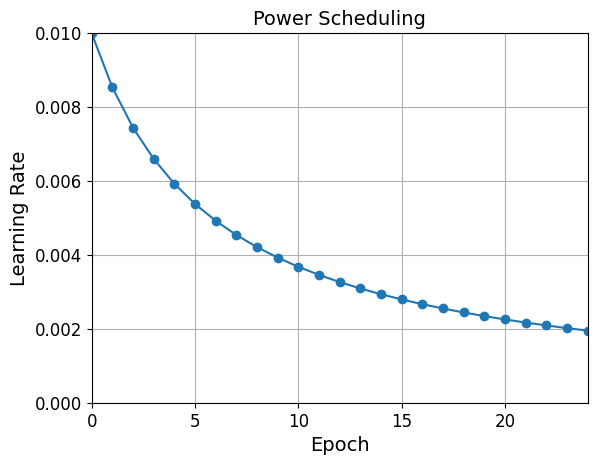

In [206]:
import math

learning_rate = 0.01
decay = 1e-4
batch_size = 32
n_steps_per_epoch = math.ceil(len(X_train) / batch_size)
epochs = np.arange(n_epochs)
lrs = learning_rate / (1 + decay * epochs * n_steps_per_epoch)

plt.plot(epochs, lrs,  "o-")
plt.axis([0, n_epochs - 1, 0, 0.01])
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Power Scheduling", fontsize=14)
plt.grid(True)
plt.show()

### Exponential Scheduling

```lr = lr0 * 0.1**(epoch / s)```

In [207]:
def exponential_decay_fn(epoch):
    return 0.01 * 0.1**(epoch / 20)

In [208]:
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1**(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(lr0=0.01, s=20)

In [209]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 25

In [210]:
lr_scheduler = keras.callbacks.LearningRateScheduler(exponential_decay_fn)
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[lr_scheduler])

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7547 - loss: 0.9997 - val_accuracy: 0.7946 - val_loss: 0.7405 - learning_rate: 0.0100
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8087 - loss: 0.6082 - val_accuracy: 0.8268 - val_loss: 0.6011 - learning_rate: 0.0089
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8257 - loss: 0.5603 - val_accuracy: 0.8124 - val_loss: 0.6792 - learning_rate: 0.0079
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8398 - loss: 0.5137 - val_accuracy: 0.8524 - val_loss: 0.5216 - learning_rate: 0.0071
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8501 - loss: 0.4810 - val_accuracy: 0.8572 - val_loss: 0.5616 - learning_rate: 0.0063
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8535 - loss: 0.4745 - val_accuracy: 0.8594 - val_loss: 0.5934 - learning_rate: 0.0056
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8673 - l

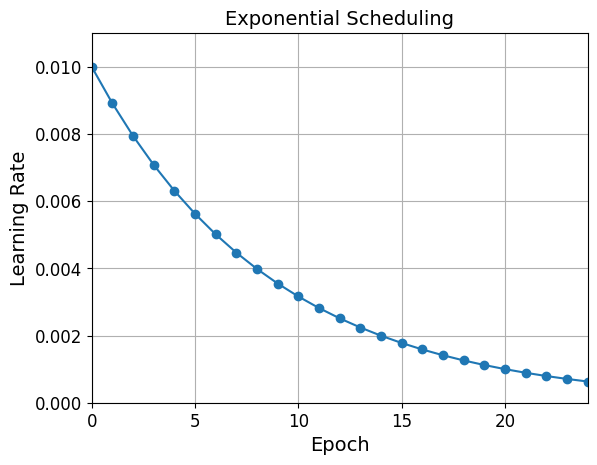

In [211]:
plt.plot(history.epoch, history.history["learning_rate"], "o-")
plt.axis([0, n_epochs - 1, 0, 0.011])
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Exponential Scheduling", fontsize=14)
plt.grid(True)
plt.show()

The schedule function can take the current learning rate as a second argument:

In [212]:
def exponential_decay_fn(epoch, lr):
    return lr * 0.1**(1 / 20)

If you want to update the learning rate at each iteration rather than at each epoch, you must write your own callback class:

In [213]:
K = keras.backend

class ExponentialDecay(keras.callbacks.Callback):
    def __init__(self, s=40000):
        super().__init__()
        self.s = s

    def on_batch_begin(self, batch, logs=None):
        # Note: the `batch` argument is reset at each epoch
        # Get current learning rate using .numpy() for tf.Variable
        lr = self.model.optimizer.learning_rate.numpy()
        # Calculate new learning rate
        new_lr = lr * 0.1**(1 / self.s)
        # Assign the new learning rate to the optimizer's learning_rate tf.Variable
        self.model.optimizer.learning_rate.assign(new_lr)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Log the final learning rate for the epoch
        logs['lr'] = self.model.optimizer.learning_rate.numpy()

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
lr0 = 0.01
optimizer = keras.optimizers.Nadam(learning_rate=lr0)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])
n_epochs = 25

s = 20 * len(X_train) // 32 # number of steps in 20 epochs (batch size = 32)
exp_decay = ExponentialDecay(s)
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[exp_decay])

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7575 - loss: 0.9749 - val_accuracy: 0.8088 - val_loss: 0.6646 - lr: 0.0089
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8055 - loss: 0.6331 - val_accuracy: 0.8174 - val_loss: 0.5832 - lr: 0.0079
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8190 - loss: 0.5978 - val_accuracy: 0.8504 - val_loss: 0.5312 - lr: 0.0071
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8417 - loss: 0.5193 - val_accuracy: 0.8450 - val_loss: 0.5847 - lr: 0.0063
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8438 - loss: 0.5176 - val_accuracy: 0.8428 - val_loss: 0.5331 - lr: 0.0056
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8677 - loss: 0.4214 - val_accuracy: 0.8528 - val_loss: 0.5598 - lr: 0.0050
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8707 - loss: 0.4047 - val_accuracy: 0.8520 - val_loss: 0.4989 - lr: 0.004

In [214]:
n_steps = n_epochs * len(X_train) // 32
steps = np.arange(n_steps)
lrs = lr0 * 0.1**(steps / s)

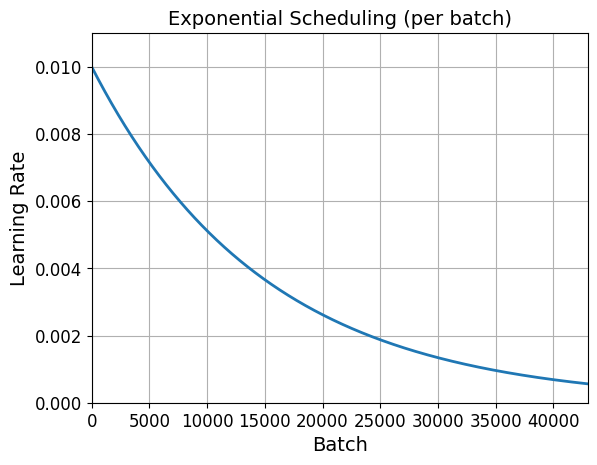

In [215]:
plt.plot(steps, lrs, "-", linewidth=2)
plt.axis([0, n_steps - 1, 0, lr0 * 1.1])
plt.xlabel("Batch")
plt.ylabel("Learning Rate")
plt.title("Exponential Scheduling (per batch)", fontsize=14)
plt.grid(True)
plt.show()

### Piecewise Constant Scheduling

In [216]:
def piecewise_constant_fn(epoch):
    if epoch < 5:
        return 0.01
    elif epoch < 15:
        return 0.005
    else:
        return 0.001

In [217]:
def piecewise_constant(boundaries, values):
    boundaries = np.array([0] + boundaries)
    values = np.array(values)
    def piecewise_constant_fn(epoch):
        return values[np.argmax(boundaries > epoch) - 1]
    return piecewise_constant_fn

piecewise_constant_fn = piecewise_constant([5, 15], [0.01, 0.005, 0.001])

In [218]:
lr_scheduler = keras.callbacks.LearningRateScheduler(piecewise_constant_fn)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 25
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[lr_scheduler])

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7563 - loss: 0.9915 - val_accuracy: 0.7688 - val_loss: 0.7610 - learning_rate: 0.0100
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7813 - loss: 0.7436 - val_accuracy: 0.7766 - val_loss: 0.8140 - learning_rate: 0.0100
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7705 - loss: 0.7788 - val_accuracy: 0.8116 - val_loss: 0.7934 - learning_rate: 0.0100
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7683 - loss: 0.8712 - val_accuracy: 0.7850 - val_loss: 0.8030 - learning_rate: 0.0100
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7878 - loss: 0.7441 - val_accuracy: 0.7682 - val_loss: 0.9153 - learning_rate: 0.0100
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8424 - loss: 0.5454 - val_accuracy: 0.8512 - val_loss: 0.6236 - learning_rate: 0.0050
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8610 - l

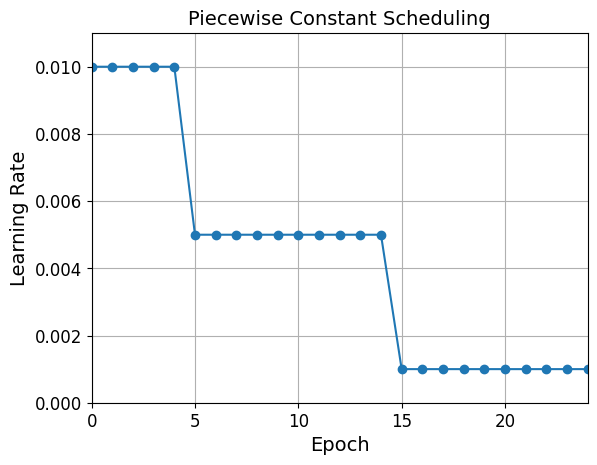

In [219]:
plt.plot(history.epoch, [piecewise_constant_fn(epoch) for epoch in history.epoch], "o-")
plt.axis([0, n_epochs - 1, 0, 0.011])
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Piecewise Constant Scheduling", fontsize=14)
plt.grid(True)
plt.show()

### Performance Scheduling

In [220]:
tf.random.set_seed(42)
np.random.seed(42)

In [221]:
lr_scheduler = keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
optimizer = keras.optimizers.SGD(learning_rate=0.02, momentum=0.9)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])
n_epochs = 25
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[lr_scheduler])

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7733 - loss: 0.7157 - val_accuracy: 0.8512 - val_loss: 0.4901 - learning_rate: 0.0200
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8352 - loss: 0.5182 - val_accuracy: 0.8484 - val_loss: 0.6145 - learning_rate: 0.0200
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8440 - loss: 0.5191 - val_accuracy: 0.8492 - val_loss: 0.5602 - learning_rate: 0.0200
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8483 - loss: 0.5128 - val_accuracy: 0.8520 - val_loss: 0.5831 - learning_rate: 0.0200
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8503 - loss: 0.5127 - val_accuracy: 0.8566 - val_loss: 0.5628 - learning_rate: 0.0200
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8503 - loss: 0.5462 - val_accuracy: 0.8580 - val_loss: 0.5675 - learning_rate: 0.0200
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8810 - l

Available keys in history: dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])


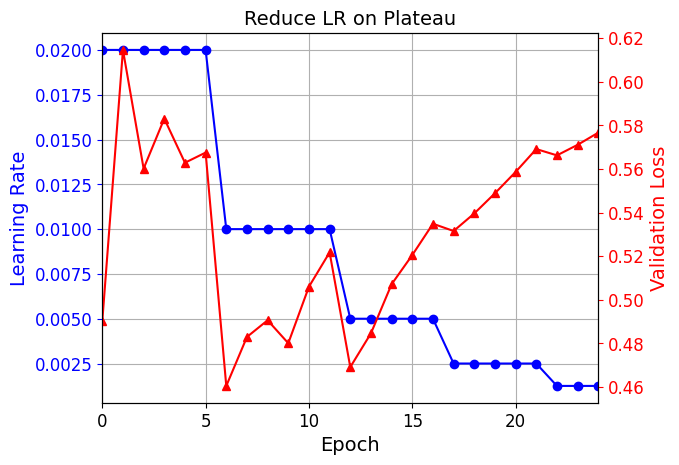

In [222]:
# First, check what keys are available
print("Available keys in history:", history.history.keys())

# Then use the correct key (often 'learning_rate' instead of 'lr')
plt.plot(history.epoch, history.history.get('lr', history.history.get('learning_rate')), "bo-")
plt.xlabel("Epoch")
plt.ylabel("Learning Rate", color='b')
plt.tick_params('y', colors='b')
plt.gca().set_xlim(0, n_epochs - 1)
plt.grid(True)

ax2 = plt.gca().twinx()
ax2.plot(history.epoch, history.history["val_loss"], "r^-")
ax2.set_ylabel('Validation Loss', color='r')
ax2.tick_params('y', colors='r')

plt.title("Reduce LR on Plateau", fontsize=14)
plt.show()

### tf.keras schedulers

In [223]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
s = 20 * len(X_train) // 32 # number of steps in 20 epochs (batch size = 32)
learning_rate = keras.optimizers.schedules.ExponentialDecay(0.01, s, 0.1)
optimizer = keras.optimizers.SGD(learning_rate)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])
n_epochs = 25
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7926 - loss: 0.5977 - val_accuracy: 0.8568 - val_loss: 0.4083
Epoch 2/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8619 - loss: 0.3880 - val_accuracy: 0.8656 - val_loss: 0.3772
Epoch 3/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8753 - loss: 0.3513 - val_accuracy: 0.8700 - val_loss: 0.3622
Epoch 4/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8839 - loss: 0.3276 - val_accuracy: 0.8734 - val_loss: 0.3524
Epoch 5/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8906 - loss: 0.3101 - val_accuracy: 0.8758 - val_loss: 0.3459
Epoch 6/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8954 - loss: 0.2964 - val_accuracy: 0.8768 - val_loss: 0.3411
Epoch 7/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8998 - loss: 0.2851 - val_accuracy: 0.8794 - val_loss: 0.3374
Epoch 8/25
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9035 - loss: 0.2757 - 

For piecewise constant scheduling, try this:

In [224]:
learning_rate = keras.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=[5. * n_steps_per_epoch, 15. * n_steps_per_epoch],
    values=[0.01, 0.005, 0.001])

### 1Cycle scheduling

In [228]:
K = keras.backend

class ExponentialLearningRate(keras.callbacks.Callback):
    def __init__(self, factor):
        self.factor = factor
        self.rates = []
        self.losses = []
    def on_batch_end(self, batch, logs):
        # Use .numpy() to get the current learning rate value from the tf.Variable
        current_lr = self.model.optimizer.learning_rate.numpy()
        self.rates.append(current_lr)
        self.losses.append(logs["loss"])
        # Use .assign() to set the new learning rate value to the tf.Variable
        self.model.optimizer.learning_rate.assign(current_lr * self.factor)

def find_learning_rate(model, X, y, epochs=1, batch_size=32, min_rate=10**-5, max_rate=10):
    init_weights = model.get_weights()
    iterations = math.ceil(len(X) / batch_size) * epochs
    factor = np.exp(np.log(max_rate / min_rate) / iterations)
    # Get initial learning rate value using .numpy() and assign new min_rate using .assign()
    init_lr_val = model.optimizer.learning_rate.numpy()
    model.optimizer.learning_rate.assign(min_rate)
    exp_lr = ExponentialLearningRate(factor)
    history = model.fit(X, y, epochs=epochs, batch_size=batch_size,
                        callbacks=[exp_lr])
    # Restore original learning rate value using .assign()
    model.optimizer.learning_rate.assign(init_lr_val)
    model.set_weights(init_weights)
    return exp_lr.rates, exp_lr.losses

def plot_lr_vs_loss(rates, losses):
    plt.plot(rates, losses)
    plt.gca().set_xscale('log')
    plt.hlines(min(losses), min(rates), max(rates))
    plt.axis([min(rates), max(rates), min(losses), (losses[0] + min(losses)) / 2])
    plt.xlabel("Learning rate")
    plt.ylabel("Loss")

**Warning**: In the `on_batch_end()` method, `logs["loss"]` used to contain the batch loss, but in TensorFlow 2.2.0 it was replaced with the mean loss (since the start of the epoch). This explains why the graph below is much smoother than in the book (if you are using TF 2.2 or above). It also means that there is a lag between the moment the batch loss starts exploding and the moment the explosion becomes clear in the graph. So you should choose a slightly smaller learning rate than you would have chosen with the "noisy" graph. Alternatively, you can tweak the `ExponentialLearningRate` callback above so it computes the batch loss (based on the current mean loss and the previous mean loss):

```python
class ExponentialLearningRate(keras.callbacks.Callback):
    def __init__(self, factor):
        self.factor = factor
        self.rates = []
        self.losses = []
    def on_epoch_begin(self, epoch, logs=None):
        self.prev_loss = 0
    def on_batch_end(self, batch, logs=None):
        batch_loss = logs["loss"] * (batch + 1) - self.prev_loss * batch
        self.prev_loss = logs["loss"]
        self.rates.append(K.get_value(self.model.optimizer.learning_rate))
        self.losses.append(batch_loss)
        K.set_value(self.model.optimizer.learning_rate, self.model.optimizer.learning_rate * self.factor)
```

In [226]:
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.SGD(learning_rate=1e-3),
              metrics=["accuracy"])

430/430 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.2783 - loss: nan


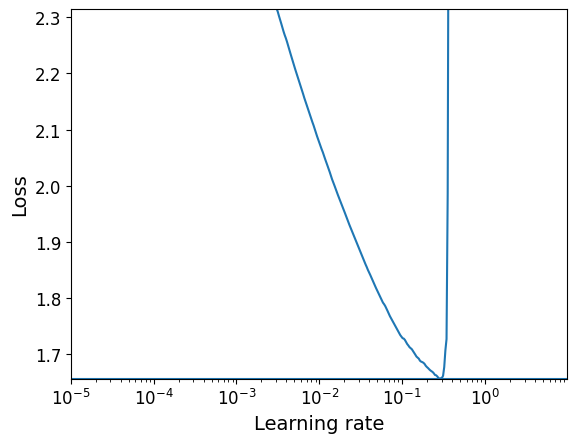

In [229]:
batch_size = 128
rates, losses = find_learning_rate(model, X_train_scaled, y_train, epochs=1, batch_size=batch_size)
plot_lr_vs_loss(rates, losses)

In [232]:
class OneCycleScheduler(keras.callbacks.Callback):
    def __init__(self, iterations, max_rate, start_rate=None,
                 last_iterations=None, last_rate=None):
        self.iterations = iterations
        self.max_rate = max_rate
        self.start_rate = start_rate or max_rate / 10
        self.last_iterations = last_iterations or iterations // 10 + 1
        self.half_iteration = (iterations - self.last_iterations) // 2
        self.last_rate = last_rate or self.start_rate / 1000
        self.iteration = 0
    def _interpolate(self, iter1, iter2, rate1, rate2):
        return ((rate2 - rate1) * (self.iteration - iter1)
                / (iter2 - iter1) + rate1)
    def on_batch_begin(self, batch, logs):
        if self.iteration < self.half_iteration:
            rate = self._interpolate(0, self.half_iteration, self.start_rate, self.max_rate)
        elif self.iteration < 2 * self.half_iteration:
            rate = self._interpolate(self.half_iteration, 2 * self.half_iteration,
                                     self.max_rate, self.start_rate)
        else:
            rate = self._interpolate(2 * self.half_iteration, self.iterations,
                                     self.start_rate, self.last_rate)
        self.iteration += 1
        self.model.optimizer.learning_rate.assign(rate)

In [233]:
n_epochs = 25
onecycle = OneCycleScheduler(math.ceil(len(X_train) / batch_size) * n_epochs, max_rate=0.05)
history = model.fit(X_train_scaled, y_train, epochs=n_epochs, batch_size=batch_size,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[onecycle])

Epoch 1/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6911 - loss: 0.8888 - val_accuracy: 0.8374 - val_loss: 0.4846
Epoch 2/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8336 - loss: 0.4700 - val_accuracy: 0.8548 - val_loss: 0.4307
Epoch 3/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8531 - loss: 0.4181 - val_accuracy: 0.8610 - val_loss: 0.4054
Epoch 4/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8626 - loss: 0.3887 - val_accuracy: 0.8660 - val_loss: 0.3884
Epoch 5/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8700 - loss: 0.3674 - val_accuracy: 0.8700 - val_loss: 0.3748
Epoch 6/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8749 - loss: 0.3503 - val_accuracy: 0.8732 - val_loss: 0.3639
Epoch 7/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8800 - loss: 0.3355 - val_accuracy: 0.8746 - val_loss: 0.3554
Epoch 8/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8842 - loss: 0.3224 - val_accuracy: 0.

## 2.7 Regularization Techniques - Fighting Overfitting

### What is Overfitting?

When a model learns the training data too well, including noise and irrelevant patterns, it performs poorly on new data.

**Signs of Overfitting:**
- Training accuracy high, validation accuracy low
- Large gap between training and validation loss

### Regularization Techniques:

**1. L1 Regularization (Lasso):**
- Adds `λ * |weights|` to loss
- Promotes sparsity (many weights become exactly 0)
- Good for feature selection

**2. L2 Regularization (Ridge):**
- Adds `λ * weights²` to loss
- Penalizes large weights
- Most commonly used

**3. Dropout:**
- Randomly "drop" (set to 0) a percentage of neurons during training
- Prevents co-adaptation of neurons
- Acts like training ensemble of networks
- Typically use 20-50% dropout rate

**4. Early Stopping:**
- Stop training when validation performance stops improving
- Simple but effective

**5. Data Augmentation:**
- Create variations of training data
- For images: rotation, flipping, zooming, etc.
- Increases effective dataset size

**6. Ensemble Methods:**
- Train multiple models
- Combine their predictions
- Reduces variance


In [234]:
n_epochs = 25
onecycle = OneCycleScheduler(math.ceil(len(X_train) / batch_size) * n_epochs, max_rate=0.05)
history = model.fit(X_train_scaled, y_train, epochs=n_epochs, batch_size=batch_size,
                    validation_data=(X_valid_scaled, y_valid),
                    callbacks=[onecycle])

Epoch 1/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9434 - loss: 0.1674 - val_accuracy: 0.8918 - val_loss: 0.3139
Epoch 2/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9429 - loss: 0.1695 - val_accuracy: 0.8918 - val_loss: 0.3165
Epoch 3/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9420 - loss: 0.1702 - val_accuracy: 0.8908 - val_loss: 0.3199
Epoch 4/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9421 - loss: 0.1705 - val_accuracy: 0.8898 - val_loss: 0.3244
Epoch 5/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9416 - loss: 0.1706 - val_accuracy: 0.8902 - val_loss: 0.3297
Epoch 6/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9410 - loss: 0.1706 - val_accuracy: 0.8896 - val_loss: 0.3360
Epoch 7/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9408 - loss: 0.1706 - val_accuracy: 0.8880 - val_loss: 0.3432
Epoch 8/25
430/430 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9406 - loss: 0.1707 - val_accuracy: 0.

In [235]:
layer = keras.layers.Dense(100, activation="elu",
                           kernel_initializer="he_normal",
                           kernel_regularizer=keras.regularizers.l2(0.01))
# or l1(0.1) for ℓ1 regularization with a factor of 0.1
# or l1_l2(0.1, 0.01) for both ℓ1 and ℓ2 regularization, with factors 0.1 and 0.01 respectively

In [236]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="elu",
                       kernel_initializer="he_normal",
                       kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.Dense(100, activation="elu",
                       kernel_initializer="he_normal",
                       kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.Dense(10, activation="softmax",
                       kernel_regularizer=keras.regularizers.l2(0.01))
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 2
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8005 - loss: 3.2306 - val_accuracy: 0.8396 - val_loss: 0.7071
Epoch 2/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8219 - loss: 0.7283 - val_accuracy: 0.8448 - val_loss: 0.6861


In [237]:
from functools import partial

RegularizedDense = partial(keras.layers.Dense,
                           activation="elu",
                           kernel_initializer="he_normal",
                           kernel_regularizer=keras.regularizers.l2(0.01))

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    RegularizedDense(300),
    RegularizedDense(100),
    RegularizedDense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 2
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7943 - loss: 3.3485 - val_accuracy: 0.8388 - val_loss: 0.7053
Epoch 2/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8216 - loss: 0.7297 - val_accuracy: 0.8434 - val_loss: 0.6845


## Dropout

In [238]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(rate=0.2),
    keras.layers.Dense(300, activation="elu", kernel_initializer="he_normal"),
    keras.layers.Dropout(rate=0.2),
    keras.layers.Dense(100, activation="elu", kernel_initializer="he_normal"),
    keras.layers.Dropout(rate=0.2),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 2
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7585 - loss: 0.7396 - val_accuracy: 0.8648 - val_loss: 0.3595
Epoch 2/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8422 - loss: 0.4328 - val_accuracy: 0.8648 - val_loss: 0.3528


## Alpha Dropout

In [239]:
tf.random.set_seed(42)
np.random.seed(42)

In [240]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.AlphaDropout(rate=0.2),
    keras.layers.Dense(300, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.AlphaDropout(rate=0.2),
    keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal"),
    keras.layers.AlphaDropout(rate=0.2),
    keras.layers.Dense(10, activation="softmax")
])
optimizer = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])
n_epochs = 20
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7151 - loss: 0.8045 - val_accuracy: 0.8374 - val_loss: 0.5704
Epoch 2/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7933 - loss: 0.5619 - val_accuracy: 0.8514 - val_loss: 0.5294
Epoch 3/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8031 - loss: 0.5326 - val_accuracy: 0.8450 - val_loss: 0.5258
Epoch 4/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8084 - loss: 0.5098 - val_accuracy: 0.8628 - val_loss: 0.4726
Epoch 5/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8193 - loss: 0.4935 - val_accuracy: 0.8612 - val_loss: 0.4582
Epoch 6/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8196 - loss: 0.4821 - val_accuracy: 0.8604 - val_loss: 0.4738
Epoch 7/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8237 - loss: 0.4743 - val_accuracy: 0.8662 - val_loss: 0.4475
Epoch 8/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8259 - loss: 0.4650 -

In [241]:
model.evaluate(X_test_scaled, y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8636 - loss: 0.4645


[0.4732603132724762, 0.8608999848365784]

In [242]:
model.evaluate(X_train_scaled, y_train)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8754 - loss: 0.3582


[0.3580441474914551, 0.8777818083763123]

In [243]:
history = model.fit(X_train_scaled, y_train)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8439 - loss: 0.4183


## MC Dropout

In [244]:
tf.random.set_seed(42)
np.random.seed(42)

In [245]:
y_probas = np.stack([model(X_test_scaled, training=True)
                     for sample in range(100)])
y_proba = y_probas.mean(axis=0)
y_std = y_probas.std(axis=0)

In [246]:
np.round(model.predict(X_test_scaled[:1]), 2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]], dtype=float32)

In [247]:
np.round(y_probas[:, :1], 2)

array([[[0.  , 0.  , 0.  , 0.  , 0.  , 0.15, 0.  , 0.01, 0.  , 0.84]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.03, 0.  , 0.02, 0.  , 0.95]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.08, 0.  , 0.23, 0.  , 0.69]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.04, 0.  , 0.03, 0.  , 0.93]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.03, 0.  , 0.06, 0.  , 0.92]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.02, 0.  , 0.  , 0.  , 0.98]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.45, 0.  , 0.18, 0.  , 0.37]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.02, 0.  , 0.02, 0.  , 0.96]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.14, 0.  , 0.05, 0.  , 0.81]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.11, 0.  , 0.09, 0.  , 0.8 ]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.08, 0.  , 0.03, 0.  , 0.89]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.04, 0.  , 0.96]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.05, 0.  , 0.03, 0.  , 0.92]],

       [[0.  , 0.  , 0.  , 0.  , 0.  , 0.17, 0.  , 0.07, 0.  , 0

In [248]:
np.round(y_proba[:1], 2)

array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.11, 0.  , 0.12, 0.  , 0.77]],
      dtype=float32)

In [249]:
y_std = y_probas.std(axis=0)
np.round(y_std[:1], 2)

array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.15, 0.  , 0.14, 0.01, 0.22]],
      dtype=float32)

In [250]:
y_pred = np.argmax(y_proba, axis=1)

In [251]:
accuracy = np.sum(y_pred == y_test) / len(y_test)
accuracy

np.float64(0.8613)

In [252]:
class MCDropout(keras.layers.Dropout):
    def call(self, inputs):
        return super().call(inputs, training=True)

class MCAlphaDropout(keras.layers.AlphaDropout):
    def call(self, inputs):
        return super().call(inputs, training=True)

In [253]:
tf.random.set_seed(42)
np.random.seed(42)

In [254]:
mc_model = keras.models.Sequential([
    MCAlphaDropout(layer.rate) if isinstance(layer, keras.layers.AlphaDropout) else layer
    for layer in model.layers
])

In [255]:
mc_model.summary()

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_18 (Flatten)            │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mc_alpha_dropout                │ (None, 784)            │             0 │
│ (MCAlphaDropout)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_266 (Dense)               │ (None, 300)            │       235,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mc_alpha_dropout_1              │ (None, 300)            │             0 │
│ (MCAlphaDropout)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mc_alpha_dropout_2              │ (None, 100)            │             0 │
│ (MCAlphaDropout)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 10)             │         1,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 266,610 (1.02 MB)

 Trainable params: 266,610 (1.02 MB)

 Non-trainable params: 0 (0.00 B)

In [256]:
optimizer = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
mc_model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

In [257]:
mc_model.set_weights(model.get_weights())

Now we can use the model with MC Dropout:

In [258]:
np.round(np.mean([mc_model.predict(X_test_scaled[:1]) for sample in range(100)], axis=0), 2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━

array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.1 , 0.  , 0.13, 0.  , 0.78]],
      dtype=float32)

## Max norm

In [259]:
layer = keras.layers.Dense(100, activation="selu", kernel_initializer="lecun_normal",
                           kernel_constraint=keras.constraints.max_norm(1.))

In [260]:
MaxNormDense = partial(keras.layers.Dense,
                       activation="selu", kernel_initializer="lecun_normal",
                       kernel_constraint=keras.constraints.max_norm(1.))

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    MaxNormDense(300),
    MaxNormDense(100),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
n_epochs = 2
history = model.fit(X_train_scaled, y_train, epochs=n_epochs,
                    validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8066 - loss: 0.5764 - val_accuracy: 0.8610 - val_loss: 0.3837
Epoch 2/2
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8662 - loss: 0.3720 - val_accuracy: 0.8674 - val_loss: 0.3637


# Exercises

## 1. to 7.

See appendix A.

## 8. Deep Learning on CIFAR10

### a.
*Exercise: Build a DNN with 20 hidden layers of 100 neurons each (that's too many, but it's the point of this exercise). Use He initialization and the ELU activation function.*

In [261]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[32, 32, 3]))
for _ in range(20):
    model.add(keras.layers.Dense(100,
                                 activation="elu",
                                 kernel_initializer="he_normal"))

Let's add the output layer to the model:

In [262]:
model.add(keras.layers.Dense(10, activation="softmax"))

Let's use a Nadam optimizer with a learning rate of 5e-5. I tried learning rates 1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3 and 1e-2, and I compared their learning curves for 10 epochs each (using the TensorBoard callback, below). The learning rates 3e-5 and 1e-4 were pretty good, so I tried 5e-5, which turned out to be slightly better.

In [263]:
optimizer = keras.optimizers.Nadam(learning_rate=5e-5)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

Let's load the CIFAR10 dataset. We also want to use early stopping, so we need a validation set. Let's use the first 5,000 images of the original training set as the validation set:

In [264]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.cifar10.load_data()

X_train = X_train_full[5000:]
y_train = y_train_full[5000:]
X_valid = X_train_full[:5000]
y_valid = y_train_full[:5000]

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


Now we can create the callbacks we need and train the model:

In [265]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("my_cifar10_model.h5", save_best_only=True)
run_index = 1 # increment every time you train the model
run_logdir = os.path.join(os.curdir, "my_cifar10_logs", "run_{:03d}".format(run_index))
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
callbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]

In [266]:
%tensorboard --logdir=./my_cifar10_logs --port=6006

ERROR: Failed to launch TensorBoard (exited with 255).
Contents of stderr:
2026-02-22 09:01:48.874974: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771750908.895115   53021 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771750908.901558   53021 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771750908.922838   53021 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771750908.922866   53021 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:

In [267]:
model.fit(X_train, y_train, epochs=100,
          validation_data=(X_valid, y_valid),
          callbacks=callbacks)

Epoch 1/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1375 - loss: 14.5792

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - accuracy: 0.1375 - loss: 14.5723 - val_accuracy: 0.2242 - val_loss: 2.1572
Epoch 2/100
1402/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2306 - loss: 2.1177

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.2307 - loss: 2.1175 - val_accuracy: 0.2760 - val_loss: 2.0204
Epoch 3/100
1399/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2744 - loss: 1.9868

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.2745 - loss: 1.9866 - val_accuracy: 0.3016 - val_loss: 1.9231
Epoch 4/100
1397/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3127 - loss: 1.8962

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.3128 - loss: 1.8960 - val_accuracy: 0.3422 - val_loss: 1.8409
Epoch 5/100
1402/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3347 - loss: 1.8335

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.3347 - loss: 1.8334 - val_accuracy: 0.3570 - val_loss: 1.7902
Epoch 6/100
1399/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3596 - loss: 1.7775

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.3597 - loss: 1.7775 - val_accuracy: 0.3776 - val_loss: 1.7440
Epoch 7/100
1401/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3786 - loss: 1.7304

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.3786 - loss: 1.7304 - val_accuracy: 0.3830 - val_loss: 1.7128
Epoch 8/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3927 - loss: 1.6873

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.3927 - loss: 1.6873 - val_accuracy: 0.4040 - val_loss: 1.6583
Epoch 9/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4076 - loss: 1.6523 - val_accuracy: 0.4052 - val_loss: 1.6762
Epoch 10/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.4193 - loss: 1.6234 - val_accuracy: 0.4110 - val_loss: 1.6626
Epoch 11/100
1403/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4294 - loss: 1.5968

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4294 - loss: 1.5968 - val_accuracy: 0.4194 - val_loss: 1.6221
Epoch 12/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4385 - loss: 1.5712

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4385 - loss: 1.5712 - val_accuracy: 0.4290 - val_loss: 1.6084
Epoch 13/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4456 - loss: 1.5453 - val_accuracy: 0.4224 - val_loss: 1.6145
Epoch 14/100
1400/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4553 - loss: 1.5264

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4553 - loss: 1.5264 - val_accuracy: 0.4394 - val_loss: 1.5833
Epoch 15/100
1403/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4610 - loss: 1.5111

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4610 - loss: 1.5111 - val_accuracy: 0.4372 - val_loss: 1.5785
Epoch 16/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4688 - loss: 1.4953 - val_accuracy: 0.4376 - val_loss: 1.5863
Epoch 17/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4751 - loss: 1.4775

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4751 - loss: 1.4775 - val_accuracy: 0.4410 - val_loss: 1.5710
Epoch 18/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.4777 - loss: 1.4617 - val_accuracy: 0.4380 - val_loss: 1.5975
Epoch 19/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4849 - loss: 1.4463 - val_accuracy: 0.4314 - val_loss: 1.6015
Epoch 20/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4903 - loss: 1.4309 - val_accuracy: 0.4348 - val_loss: 1.6022
Epoch 21/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.4938 - loss: 1.4198 - val_accuracy: 0.4356 - val_loss: 1.6054
Epoch 22/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4989 - loss: 1.4049 - val_accuracy: 0.4306 - val_loss: 1.6157
Epoch 23/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5023 - loss: 1.3945 - val_accuracy: 0.4358 - val_loss: 1.6246
Epoch 24/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.5055 - loss: 1.3864

In [268]:
model = keras.models.load_model("my_cifar10_model.h5")
model.evaluate(X_valid, y_valid)

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4415 - loss: 1.5764


[1.5710104703903198, 0.4410000145435333]

The model with the lowest validation loss gets about 47.6% accuracy on the validation set. It took 27 epochs to reach the lowest validation loss, with roughly 8 seconds per epoch on my laptop (without a GPU). Let's see if we can improve performance using Batch Normalization.

The code below is very similar to the code above, with a few changes:

* I added a BN layer after every Dense layer (before the activation function), except for the output layer. I also added a BN layer before the first hidden layer.
* I changed the learning rate to 5e-4. I experimented with 1e-5, 3e-5, 5e-5, 1e-4, 3e-4, 5e-4, 1e-3 and 3e-3, and I chose the one with the best validation performance after 20 epochs.
* I renamed the run directories to run_bn_* and the model file name to my_cifar10_bn_model.h5.

In [269]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[32, 32, 3]))
model.add(keras.layers.BatchNormalization())
for _ in range(20):
    model.add(keras.layers.Dense(100, kernel_initializer="he_normal"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("elu"))
model.add(keras.layers.Dense(10, activation="softmax"))

optimizer = keras.optimizers.Nadam(learning_rate=5e-4)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("my_cifar10_bn_model.h5", save_best_only=True)
run_index = 1 # increment every time you train the model
run_logdir = os.path.join(os.curdir, "my_cifar10_logs", "run_bn_{:03d}".format(run_index))
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
callbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]

model.fit(X_train, y_train, epochs=100,
          validation_data=(X_valid, y_valid),
          callbacks=callbacks)

model = keras.models.load_model("my_cifar10_bn_model.h5")
model.evaluate(X_valid, y_valid)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2918 - loss: 1.9878

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 37s 12ms/step - accuracy: 0.2918 - loss: 1.9877 - val_accuracy: 0.4024 - val_loss: 1.6765
Epoch 2/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4000 - loss: 1.6857

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.4000 - loss: 1.6856 - val_accuracy: 0.4260 - val_loss: 1.6177
Epoch 3/100
1400/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4388 - loss: 1.5882

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.4389 - loss: 1.5881 - val_accuracy: 0.4516 - val_loss: 1.5562
Epoch 4/100
1403/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4652 - loss: 1.5127

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.4652 - loss: 1.5126 - val_accuracy: 0.4620 - val_loss: 1.5393
Epoch 5/100
1406/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4882 - loss: 1.4481

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - accuracy: 0.4882 - loss: 1.4481 - val_accuracy: 0.4690 - val_loss: 1.5236
Epoch 6/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.5102 - loss: 1.3915 - val_accuracy: 0.4768 - val_loss: 1.5251
Epoch 7/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.5309 - loss: 1.3377 - val_accuracy: 0.4766 - val_loss: 1.5391
Epoch 8/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.5487 - loss: 1.2860 - val_accuracy: 0.4756 - val_loss: 1.5565
Epoch 9/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.5670 - loss: 1.2398 - val_accuracy: 0.4716 - val_loss: 1.5801
Epoch 10/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.5833 - loss: 1.1948 - val_accuracy: 0.4650 - val_loss: 1.6166
Epoch 11/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6013 - loss: 1.1518 - val_accuracy: 0.4624 - val_loss: 1.6510
Epoch 12/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - accuracy: 0.6121 - loss: 1.

157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4731 - loss: 1.5178


[1.5235663652420044, 0.4690000116825104]

* *Is the model converging faster than before?* Much faster! The previous model took 27 epochs to reach the lowest validation loss, while the new model achieved that same loss in just 5 epochs and continued to make progress until the 16th epoch. The BN layers stabilized training and allowed us to use a much larger learning rate, so convergence was faster.
* *Does BN produce a better model?* Yes! The final model is also much better, with 54.0% accuracy instead of 47.6%. It's still not a very good model, but at least it's much better than before (a Convolutional Neural Network would do much better, but that's a different topic, see chapter 14).
* *How does BN affect training speed?* Although the model converged much faster, each epoch took about 12s instead of 8s, because of the extra computations required by the BN layers. But overall the training time (wall time) was shortened significantly!

In [270]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=[32, 32, 3]))
for _ in range(20):
    model.add(keras.layers.Dense(100,
                                 kernel_initializer="lecun_normal",
                                 activation="selu"))
model.add(keras.layers.Dense(10, activation="softmax"))

optimizer = keras.optimizers.Nadam(learning_rate=7e-4)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20)
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("my_cifar10_selu_model.h5", save_best_only=True)
run_index = 1 # increment every time you train the model
run_logdir = os.path.join(os.curdir, "my_cifar10_logs", "run_selu_{:03d}".format(run_index))
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
callbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]

X_means = X_train.mean(axis=0)
X_stds = X_train.std(axis=0)
X_train_scaled = (X_train - X_means) / X_stds
X_valid_scaled = (X_valid - X_means) / X_stds
X_test_scaled = (X_test - X_means) / X_stds

model.fit(X_train_scaled, y_train, epochs=100,
          validation_data=(X_valid_scaled, y_valid),
          callbacks=callbacks)

model = keras.models.load_model("my_cifar10_selu_model.h5")
model.evaluate(X_valid_scaled, y_valid)

Epoch 1/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.2709 - loss: 2.0277

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - accuracy: 0.2709 - loss: 2.0276 - val_accuracy: 0.3674 - val_loss: 1.7391
Epoch 2/100
1397/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3816 - loss: 1.7269

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.3817 - loss: 1.7267 - val_accuracy: 0.4124 - val_loss: 1.6682
Epoch 3/100
1401/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4238 - loss: 1.6267

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.4239 - loss: 1.6266 - val_accuracy: 0.4292 - val_loss: 1.6547
Epoch 4/100
1401/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4535 - loss: 1.5544

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4535 - loss: 1.5543 - val_accuracy: 0.4394 - val_loss: 1.6173
Epoch 5/100
1401/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4746 - loss: 1.4957

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4746 - loss: 1.4957 - val_accuracy: 0.4554 - val_loss: 1.5810
Epoch 6/100
1406/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4958 - loss: 1.4484

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4958 - loss: 1.4484 - val_accuracy: 0.4580 - val_loss: 1.5645
Epoch 7/100
1400/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5117 - loss: 1.4017

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5117 - loss: 1.4017 - val_accuracy: 0.4714 - val_loss: 1.5578
Epoch 8/100
1405/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5279 - loss: 1.3648

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5278 - loss: 1.3648 - val_accuracy: 0.4854 - val_loss: 1.5359
Epoch 9/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.5406 - loss: 1.3326 - val_accuracy: 0.4806 - val_loss: 1.5798
Epoch 10/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5500 - loss: 1.2990

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5500 - loss: 1.2990 - val_accuracy: 0.4856 - val_loss: 1.5278
Epoch 11/100
1406/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5576 - loss: 1.2792

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5576 - loss: 1.2792 - val_accuracy: 0.4964 - val_loss: 1.5244
Epoch 12/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5690 - loss: 1.2506 - val_accuracy: 0.4918 - val_loss: 1.5530
Epoch 13/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5791 - loss: 1.2229 - val_accuracy: 0.4910 - val_loss: 1.5997
Epoch 14/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5832 - loss: 1.2136 - val_accuracy: 0.4796 - val_loss: 1.5829
Epoch 15/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5908 - loss: 1.1905 - val_accuracy: 0.4966 - val_loss: 1.5857
Epoch 16/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5947 - loss: 1.1897 - val_accuracy: 0.4302 - val_loss: 1.6370
Epoch 17/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5095 - loss: 1.3963 - val_accuracy: 0.4804 - val_loss: 1.5372
Epoch 18/100
1400/1407 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5555 - loss: 1.2753

1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5556 - loss: 1.2752 - val_accuracy: 0.4900 - val_loss: 1.5198
Epoch 19/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5800 - loss: 1.2136 - val_accuracy: 0.4968 - val_loss: 1.5259
Epoch 20/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.5978 - loss: 1.1722 - val_accuracy: 0.4892 - val_loss: 1.5442
Epoch 21/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.5980 - loss: 1.1687 - val_accuracy: 0.4962 - val_loss: 1.5803
Epoch 22/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.6167 - loss: 1.1147 - val_accuracy: 0.4834 - val_loss: 1.6114
Epoch 23/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.6207 - loss: 1.1077 - val_accuracy: 0.4988 - val_loss: 1.5913
Epoch 24/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.6322 - loss: 1.0870 - val_accuracy: 0.4960 - val_loss: 1.6184
Epoch 25/100
1407/1407 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.6299 - loss: 1.085

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4932 - loss: 1.5222


[1.5197556018829346, 0.49000000953674316]

In [271]:
model = keras.models.load_model("my_cifar10_selu_model.h5")
model.evaluate(X_valid_scaled, y_valid)

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4932 - loss: 1.5222


[1.5197556018829346, 0.49000000953674316]

We get 47.9% accuracy, which is not much better than the original model (47.6%), and not as good as the model using batch normalization (54.0%). However, convergence was almost as fast as with the BN model, plus each epoch took only 7 seconds. So it's by far the fastest model to train so far.

### e.
*Exercise: Try regularizing the model with alpha dropout. Then, without retraining your model, see if you can achieve better accuracy using MC Dropout.*

---
# Part 3: Custom Models and Training with TensorFlow
---

So far, we've used Keras' high-level API to build models. Now we'll dive deeper into TensorFlow to create custom components and training loops. This gives us ultimate flexibility and control.

## Why Learn Custom Components?

1. **Novel Architectures**: Implement research papers or your own ideas
2. **Custom Loss Functions**: For specialized tasks
3. **Advanced Training**: Fine-grained control over the training process
4. **Better Understanding**: Know what's happening under the hood
5. **Performance**: Optimize for specific use cases

## What We'll Cover:

- TensorFlow operations and tensors
- Custom loss functions
- Custom metrics
- Custom layers
- Custom models
- Custom training loops
- TensorFlow functions and graphs

## From High-Level to Low-Level:

```
Keras Sequential API     ← Easiest, least flexible
    ↓
Keras Functional API     ← More flexible
    ↓
Custom Layers            ← Custom building blocks
    ↓
Custom Models            ← Full control
    ↓
Custom Training Loops    ← Ultimate control
```


## 3.1 TensorFlow Operations and Tensors

### What are Tensors?

Tensors are the fundamental data structure in TensorFlow - multi-dimensional arrays similar to NumPy arrays but with additional capabilities:

- **GPU acceleration**: Automatic computation on GPU if available
- **Automatic differentiation**: Track operations for backpropagation
- **Distributed computing**: Run on multiple devices

### Tensor Ranks:

```
Scalar (rank 0):  42
Vector (rank 1):  [1, 2, 3]
Matrix (rank 2):  [[1, 2], [3, 4]]
3D Tensor:        [[[1, 2]], [[3, 4]]]
```

### Common Tensor Operations:

1. **Creation**: `tf.constant()`, `tf.Variable()`, `tf.zeros()`, `tf.ones()`
2. **Math**: `tf.add()`, `tf.matmul()`, `tf.reduce_sum()`
3. **Shape**: `tf.reshape()`, `tf.expand_dims()`, `tf.squeeze()`
4. **Indexing**: `tensor[0]`, `tensor[:, 1:]`

### Variables vs Constants:

- **tf.constant**: Immutable, value fixed at creation
- **tf.Variable**: Mutable, used for weights and biases


## 3.2 Custom Loss Functions

### Why Custom Loss Functions?

Standard loss functions (MSE, cross-entropy) don't always match your specific problem. Custom losses let you:

- Encode domain knowledge
- Handle imbalanced datasets
- Optimize for specific metrics
- Implement research ideas

### How to Create Custom Loss:

```python
def custom_loss(y_true, y_pred):
    # y_true: Ground truth labels
    # y_pred: Model predictions
    # Returns: Scalar loss value
    
    loss = ...  # Your calculation
    return loss
```

### Examples:

**1. Huber Loss** (robust to outliers):
```python
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = tf.abs(error) <= delta
    squared_loss = 0.5 * tf.square(error)
    linear_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.where(is_small_error, squared_loss, linear_loss)
```

**2. Focal Loss** (for imbalanced data):
- Focuses on hard examples
- Down-weights easy examples

**3. Contrastive Loss** (for similarity learning):
- Brings similar items closer
- Pushes dissimilar items apart


## 3.3 Custom Layers

### Why Custom Layers?

When standard layers don't fit your needs:
- Implement new layer types from papers
- Create domain-specific operations
- Combine multiple operations efficiently

### How to Create Custom Layer:

Subclass `keras.layers.Layer` and implement:

```python
class CustomLayer(keras.layers.Layer):
    def __init__(self, units=32, **kwargs):
        super().__init__(**kwargs)
        self.units = units
    
    def build(self, input_shape):
        # Create weights here
        self.w = self.add_weight(
            shape=(input_shape[-1], self.units),
            initializer='random_normal',
            trainable=True
        )
        self.b = self.add_weight(
            shape=(self.units,),
            initializer='zeros',
            trainable=True
        )
    
    def call(self, inputs):
        # Forward pass computation
        return tf.matmul(inputs, self.w) + self.b
```

### Key Methods:

- **`__init__`**: Initialize layer parameters
- **`build`**: Create weights (called once, knows input shape)
- **`call`**: Forward pass (called every time)
- **`get_config`**: For serialization (optional)

### State Management:

- Trainable weights: `self.add_weight(..., trainable=True)`
- Non-trainable weights: `self.add_weight(..., trainable=False)`
- Track losses: `self.add_loss()`
- Track metrics: `self.add_metric()`


## 3.4 Custom Models

### Beyond Sequential and Functional API

For complex architectures, subclass `keras.Model`:

```python
class CustomModel(keras.Model):
    def __init__(self):
        super().__init__()
        # Define layers
        self.dense1 = keras.layers.Dense(64, activation='relu')
        self.dense2 = keras.layers.Dense(10, activation='softmax')
    
    def call(self, inputs, training=False):
        # Define forward pass
        x = self.dense1(inputs)
        if training:
            # Different behavior during training
            x = tf.nn.dropout(x, rate=0.5)
        return self.dense2(x)
```

### Benefits:

1. **Conditional Logic**: Different paths based on inputs
2. **Dynamic Computation**: Loops, conditionals
3. **Multiple Inputs/Outputs**: Complex data flows
4. **State Management**: Track custom variables

### Famous Custom Models:

- **ResNet**: Skip connections
- **U-Net**: Encoder-decoder with skip connections
- **Transformer**: Multi-head attention
- **GAN**: Two models (generator and discriminator)


## 3.5 Custom Training Loops

### Why Custom Training Loops?

The `model.fit()` method is convenient but limiting. Custom loops provide:

1. **Custom Training Steps**: Multiple optimizers, adversarial training
2. **Complex Loss Computation**: Multiple losses, dynamic weighting
3. **Advanced Regularization**: Custom penalties
4. **Debugging**: Step-by-step control
5. **Research**: Implement cutting-edge techniques

### Basic Structure:

```python
# 1. Define optimizer
optimizer = keras.optimizers.Adam(learning_rate=0.01)

# 2. Training loop
for epoch in range(num_epochs):
    for batch in dataset:
        # 3. Forward pass with gradient tape
        with tf.GradientTape() as tape:
            predictions = model(batch_x, training=True)
            loss = loss_fn(batch_y, predictions)
        
        # 4. Compute gradients
        gradients = tape.gradient(loss, model.trainable_variables)
        
        # 5. Update weights
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))
```

### Key Components:

**1. GradientTape:**
- Records operations for automatic differentiation
- Context manager
- Computes gradients

**2. Optimizer:**
- Updates weights based on gradients
- Handles momentum, adaptive rates, etc.

**3. Metrics:**
- Track performance during training
- Reset between epochs

### Advanced Techniques:

- **Mixed Precision**: Use float16 for speed, float32 for stability
- **Gradient Accumulation**: Simulate larger batches
- **Multiple Optimizers**: Different parts of model
- **Custom Regularization**: Add penalties during training


## 3.6 TensorFlow Functions and Graphs

### @tf.function Decorator

Converts Python functions to TensorFlow graphs for faster execution:

```python
@tf.function
def train_step(x, y):
    with tf.GradientTape() as tape:
        predictions = model(x, training=True)
        loss = loss_fn(y, predictions)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return loss
```

### Benefits:

1. **Speed**: 10-100x faster than eager execution
2. **Optimization**: TensorFlow optimizes the graph
3. **Portability**: Can export and run elsewhere

### How It Works:

1. **First call**: Traces Python function, builds graph
2. **Subsequent calls**: Executes optimized graph
3. **Retracing**: New graph if input signature changes

### Best Practices:

- Use for training loops and inference
- Avoid Python side effects (print, append to list)
- Use `tf.print()` instead of `print()`
- Minimize retracing (consistent input shapes)

### AutoGraph:

Converts Python control flow to TensorFlow ops:

```python
@tf.function
def f(x):
    if x > 0:  # AutoGraph converts this
        return x * 2
    else:
        return x * 3
```

Becomes:
```python
tf.cond(x > 0, lambda: x * 2, lambda: x * 3)
```


## Tensors and operations

### Tensors

In [272]:
tf.constant([[1., 2., 3.], [4., 5., 6.]]) # matrix

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

In [273]:
tf.constant(42) # scalar

<tf.Tensor: shape=(), dtype=int32, numpy=42>

In [274]:
t = tf.constant([[1., 2., 3.], [4., 5., 6.]])
t

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)>

In [275]:
t.shape

TensorShape([2, 3])

In [276]:
t.dtype

tf.float32

### Indexing

In [277]:
t[:, 1:]

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[2., 3.],
       [5., 6.]], dtype=float32)>

In [278]:
t[..., 1, tf.newaxis]

<tf.Tensor: shape=(2, 1), dtype=float32, numpy=
array([[2.],
       [5.]], dtype=float32)>

### Ops

In [279]:
t + 10

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[11., 12., 13.],
       [14., 15., 16.]], dtype=float32)>

In [280]:
tf.square(t)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)>

In [281]:
t @ tf.transpose(t)

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[14., 32.],
       [32., 77.]], dtype=float32)>

### Using `keras.backend`

In [282]:
from tensorflow import keras
K = keras.backend
K.square(K.transpose(t)) + 10

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[11., 26.],
       [14., 35.],
       [19., 46.]], dtype=float32)>

### From/To NumPy

In [283]:
a = np.array([2., 4., 5.])
tf.constant(a)

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([2., 4., 5.])>

In [284]:
t.numpy()

array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)

In [285]:
np.array(t)

array([[1., 2., 3.],
       [4., 5., 6.]], dtype=float32)

In [286]:
tf.square(a)

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([ 4., 16., 25.])>

In [287]:
np.square(t)

array([[ 1.,  4.,  9.],
       [16., 25., 36.]], dtype=float32)

### Conflicting Types

In [288]:
try:
    tf.constant(2.0) + tf.constant(40)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

cannot compute AddV2 as input #1(zero-based) was expected to be a float tensor but is a int32 tensor [Op:AddV2] name: 


In [289]:
try:
    tf.constant(2.0) + tf.constant(40., dtype=tf.float64)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

cannot compute AddV2 as input #1(zero-based) was expected to be a float tensor but is a double tensor [Op:AddV2] name: 


In [290]:
t2 = tf.constant(40., dtype=tf.float64)
tf.constant(2.0) + tf.cast(t2, tf.float32)

<tf.Tensor: shape=(), dtype=float32, numpy=42.0>

### Strings

In [291]:
tf.constant(b"hello world")

<tf.Tensor: shape=(), dtype=string, numpy=b'hello world'>

In [292]:
tf.constant("café")

<tf.Tensor: shape=(), dtype=string, numpy=b'caf\xc3\xa9'>

In [293]:
u = tf.constant([ord(c) for c in "café"])
u

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233], dtype=int32)>

In [294]:
b = tf.strings.unicode_encode(u, "UTF-8")
tf.strings.length(b, unit="UTF8_CHAR")

<tf.Tensor: shape=(), dtype=int32, numpy=4>

In [295]:
tf.strings.unicode_decode(b, "UTF-8")

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([ 99,  97, 102, 233], dtype=int32)>

### String arrays

In [296]:
p = tf.constant(["Café", "Coffee", "caffè", "咖啡"])

In [297]:
tf.strings.length(p, unit="UTF8_CHAR")

<tf.Tensor: shape=(4,), dtype=int32, numpy=array([4, 6, 5, 2], dtype=int32)>

In [298]:
r = tf.strings.unicode_decode(p, "UTF8")
r

<tf.RaggedTensor [[67, 97, 102, 233], [67, 111, 102, 102, 101, 101],
 [99, 97, 102, 102, 232], [21654, 21857]]>

In [299]:
print(r)

<tf.RaggedTensor [[67, 97, 102, 233], [67, 111, 102, 102, 101, 101],
 [99, 97, 102, 102, 232], [21654, 21857]]>


### Ragged tensors

In [300]:
print(r[1])

tf.Tensor([ 67 111 102 102 101 101], shape=(6,), dtype=int32)


In [301]:
print(r[1:3])

<tf.RaggedTensor [[67, 111, 102, 102, 101, 101], [99, 97, 102, 102, 232]]>


In [302]:
r2 = tf.ragged.constant([[65, 66], [], [67]])
print(tf.concat([r, r2], axis=0))

<tf.RaggedTensor [[67, 97, 102, 233], [67, 111, 102, 102, 101, 101],
 [99, 97, 102, 102, 232], [21654, 21857], [65, 66], [], [67]]>


In [303]:
r3 = tf.ragged.constant([[68, 69, 70], [71], [], [72, 73]])
print(tf.concat([r, r3], axis=1))

<tf.RaggedTensor [[67, 97, 102, 233, 68, 69, 70], [67, 111, 102, 102, 101, 101, 71],
 [99, 97, 102, 102, 232], [21654, 21857, 72, 73]]>


In [304]:
tf.strings.unicode_encode(r3, "UTF-8")

<tf.Tensor: shape=(4,), dtype=string, numpy=array([b'DEF', b'G', b'', b'HI'], dtype=object)>

In [305]:
r.to_tensor()

<tf.Tensor: shape=(4, 6), dtype=int32, numpy=
array([[   67,    97,   102,   233,     0,     0],
       [   67,   111,   102,   102,   101,   101],
       [   99,    97,   102,   102,   232,     0],
       [21654, 21857,     0,     0,     0,     0]], dtype=int32)>

### Sparse tensors

In [306]:
s = tf.SparseTensor(indices=[[0, 1], [1, 0], [2, 3]],
                    values=[1., 2., 3.],
                    dense_shape=[3, 4])

In [307]:
print(s)

SparseTensor(indices=tf.Tensor(
[[0 1]
 [1 0]
 [2 3]], shape=(3, 2), dtype=int64), values=tf.Tensor([1. 2. 3.], shape=(3,), dtype=float32), dense_shape=tf.Tensor([3 4], shape=(2,), dtype=int64))


In [308]:
tf.sparse.to_dense(s)

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0., 1., 0., 0.],
       [2., 0., 0., 0.],
       [0., 0., 0., 3.]], dtype=float32)>

In [309]:
s2 = s * 2.0

In [310]:
try:
    s3 = s + 1.
except TypeError as ex:
    print(ex)

unsupported operand type(s) for +: 'SparseTensor' and 'float'


In [311]:
s4 = tf.constant([[10., 20.], [30., 40.], [50., 60.], [70., 80.]])
tf.sparse.sparse_dense_matmul(s, s4)

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[ 30.,  40.],
       [ 20.,  40.],
       [210., 240.]], dtype=float32)>

In [312]:
s5 = tf.SparseTensor(indices=[[0, 2], [0, 1]],
                     values=[1., 2.],
                     dense_shape=[3, 4])
print(s5)

SparseTensor(indices=tf.Tensor(
[[0 2]
 [0 1]], shape=(2, 2), dtype=int64), values=tf.Tensor([1. 2.], shape=(2,), dtype=float32), dense_shape=tf.Tensor([3 4], shape=(2,), dtype=int64))


In [313]:
try:
    tf.sparse.to_dense(s5)
except tf.errors.InvalidArgumentError as ex:
    print(ex)

{{function_node __wrapped__SparseToDense_device_/job:localhost/replica:0/task:0/device:GPU:0}} indices[1] is out of order. Many sparse ops require sorted indices.
  Use `tf.sparse.reorder` to create a correctly ordered copy.


	 [[{{node SparseToDense}}]] [Op:SparseToDense] name: 


In [314]:
s6 = tf.sparse.reorder(s5)
tf.sparse.to_dense(s6)

<tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0., 2., 1., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]], dtype=float32)>

### Sets

In [315]:
set1 = tf.constant([[2, 3, 5, 7], [7, 9, 0, 0]])
set2 = tf.constant([[4, 5, 6], [9, 10, 0]])
tf.sparse.to_dense(tf.sets.union(set1, set2))

<tf.Tensor: shape=(2, 6), dtype=int32, numpy=
array([[ 2,  3,  4,  5,  6,  7],
       [ 0,  7,  9, 10,  0,  0]], dtype=int32)>

In [316]:
tf.sparse.to_dense(tf.sets.difference(set1, set2))

<tf.Tensor: shape=(2, 3), dtype=int32, numpy=
array([[2, 3, 7],
       [7, 0, 0]], dtype=int32)>

In [317]:
tf.sparse.to_dense(tf.sets.intersection(set1, set2))

<tf.Tensor: shape=(2, 2), dtype=int32, numpy=
array([[5, 0],
       [0, 9]], dtype=int32)>

### Variables

In [318]:
v = tf.Variable([[1., 2., 3.], [4., 5., 6.]])

In [319]:
v.assign(2 * v)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2.,  4.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [320]:
v[0, 1].assign(42)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  6.],
       [ 8., 10., 12.]], dtype=float32)>

In [321]:
v[:, 2].assign([0., 1.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[ 2., 42.,  0.],
       [ 8., 10.,  1.]], dtype=float32)>

In [322]:
try:
    v[1] = [7., 8., 9.]
except TypeError as ex:
    print(ex)

'ResourceVariable' object does not support item assignment


In [323]:
v.scatter_nd_update(indices=[[0, 0], [1, 2]],
                    updates=[100., 200.])

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[100.,  42.,   0.],
       [  8.,  10., 200.]], dtype=float32)>

In [324]:
sparse_delta = tf.IndexedSlices(values=[[1., 2., 3.], [4., 5., 6.]],
                                indices=[1, 0])
v.scatter_update(sparse_delta)

<tf.Variable 'UnreadVariable' shape=(2, 3) dtype=float32, numpy=
array([[4., 5., 6.],
       [1., 2., 3.]], dtype=float32)>

### Tensor Arrays

In [325]:
array = tf.TensorArray(dtype=tf.float32, size=3)
array = array.write(0, tf.constant([1., 2.]))
array = array.write(1, tf.constant([3., 10.]))
array = array.write(2, tf.constant([5., 7.]))

In [326]:
array.read(1)

<tf.Tensor: shape=(2,), dtype=float32, numpy=array([ 3., 10.], dtype=float32)>

In [327]:
array.stack()

<tf.Tensor: shape=(3, 2), dtype=float32, numpy=
array([[1., 2.],
       [0., 0.],
       [5., 7.]], dtype=float32)>

In [328]:
mean, variance = tf.nn.moments(array.stack(), axes=0)
mean

<tf.Tensor: shape=(2,), dtype=float32, numpy=array([2., 3.], dtype=float32)>

In [329]:
variance

<tf.Tensor: shape=(2,), dtype=float32, numpy=array([4.6666665, 8.666667 ], dtype=float32)>

## Custom loss function

Let's start by loading and preparing the California housing dataset. We first load it, then split it into a training set, a validation set and a test set, and finally we scale it:

In [330]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

housing = fetch_california_housing()
X_train_full, X_test, y_train_full, y_test = train_test_split(
    housing.data, housing.target.reshape(-1, 1), random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_full, y_train_full, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

In [331]:
def huber_fn(y_true, y_pred):
    error = y_true - y_pred
    is_small_error = tf.abs(error) < 1
    squared_loss = tf.square(error) / 2
    linear_loss  = tf.abs(error) - 0.5
    return tf.where(is_small_error, squared_loss, linear_loss)

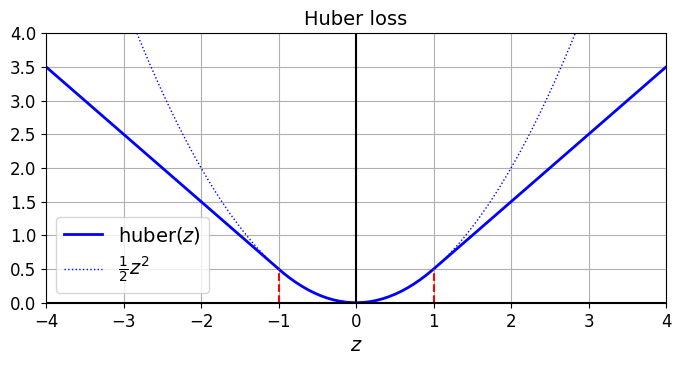

In [332]:
plt.figure(figsize=(8, 3.5))
z = np.linspace(-4, 4, 200)
plt.plot(z, huber_fn(0, z), "b-", linewidth=2, label="huber($z$)")
plt.plot(z, z**2 / 2, "b:", linewidth=1, label=r"$\frac{1}{2}z^2$")
plt.plot([-1, -1], [0, huber_fn(0., -1.)], "r--")
plt.plot([1, 1], [0, huber_fn(0., 1.)], "r--")
plt.gca().axhline(y=0, color='k')
plt.gca().axvline(x=0, color='k')
plt.axis([-4, 4, 0, 4])
plt.grid(True)
plt.xlabel("$z$")
plt.legend(fontsize=14)
plt.title("Huber loss", fontsize=14)
plt.show()

In [333]:
input_shape = X_train.shape[1:]

model = keras.models.Sequential([
    keras.layers.Dense(30, activation="selu", kernel_initializer="lecun_normal",
                       input_shape=input_shape),
    keras.layers.Dense(1),
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [334]:
model.compile(loss=huber_fn, optimizer="nadam", metrics=["mae"])

In [335]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2
363/363 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 1.1623 - mae: 1.5670 - val_loss: 0.2225 - val_mae: 0.5154
Epoch 2/2
363/363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.2187 - mae: 0.5133 - val_loss: 0.1988 - val_mae: 0.4835


## Saving/Loading Models with Custom Objects

In [336]:
model.save("my_model_with_a_custom_loss.h5")

In [337]:
model = keras.models.load_model("my_model_with_a_custom_loss.h5",
                                custom_objects={"huber_fn": huber_fn})

In [338]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

Epoch 1/2


NotImplementedError: numpy() is only available when eager execution is enabled.

In [ ]:
def create_huber(threshold=1.0):
    def huber_fn(y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < threshold
        squared_loss = tf.square(error) / 2
        linear_loss  = threshold * tf.abs(error) - threshold**2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)
    return huber_fn

In [ ]:
model.compile(loss=create_huber(2.0), optimizer="nadam", metrics=["mae"])

In [ ]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

In [ ]:
model.save("my_model_with_a_custom_loss_threshold_2.h5")

In [ ]:
model = keras.models.load_model("my_model_with_a_custom_loss_threshold_2.h5",
                                custom_objects={"huber_fn": create_huber(2.0)})

In [ ]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

In [ ]:
class HuberLoss(keras.losses.Loss):
    def __init__(self, threshold=1.0, **kwargs):
        self.threshold = threshold
        super().__init__(**kwargs)
    def call(self, y_true, y_pred):
        error = y_true - y_pred
        is_small_error = tf.abs(error) < self.threshold
        squared_loss = tf.square(error) / 2
        linear_loss  = self.threshold * tf.abs(error) - self.threshold**2 / 2
        return tf.where(is_small_error, squared_loss, linear_loss)
    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "threshold": self.threshold}

In [ ]:
model = keras.models.Sequential([
    keras.layers.Dense(30, activation="selu", kernel_initializer="lecun_normal",
                       input_shape=input_shape),
    keras.layers.Dense(1),
])

In [ ]:
model.compile(loss=HuberLoss(2.), optimizer="nadam", metrics=["mae"])

In [ ]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

In [ ]:
model.save("my_model_with_a_custom_loss_class.h5")

In [ ]:
model = keras.models.load_model("my_model_with_a_custom_loss_class.h5",
                                custom_objects={"HuberLoss": HuberLoss})

In [ ]:
model.fit(X_train_scaled, y_train, epochs=2,
          validation_data=(X_valid_scaled, y_valid))

In [ ]:
model.loss.threshold

## Other Custom Functions

In [ ]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

---
# Conclusion
---

## 🎉 Congratulations!

You've completed this comprehensive introduction to deep learning! Let's recap what we've covered:

### Part 1: Neural Networks with Keras Fundamentals
✅ Understanding perceptrons and neural network basics
✅ Activation functions and their roles
✅ Building image classifiers with Fashion MNIST
✅ Regression tasks with neural networks
✅ Using callbacks for better training control
✅ Visualizing training with TensorBoard

### Part 2: Training Deep Neural Networks
✅ Solving vanishing and exploding gradients
✅ Proper weight initialization (Xavier, He)
✅ Advanced activation functions (Leaky ReLU, ELU, SELU)
✅ Batch normalization for stable training
✅ Gradient clipping techniques
✅ Transfer learning with pre-trained models
✅ Regularization to prevent overfitting
✅ Advanced optimizers (Adam, RMSprop, etc.)
✅ Learning rate scheduling strategies

### Part 3: Custom Models and Training
✅ TensorFlow tensors and operations
✅ Creating custom loss functions
✅ Building custom layers
✅ Implementing custom models
✅ Writing custom training loops
✅ Using @tf.function for performance

---

## 🚀 Next Steps

### Continue Your Learning:

1. **Specialized Architectures:**
   - Convolutional Neural Networks (CNNs) for computer vision
   - Recurrent Neural Networks (RNNs/LSTMs) for sequences
   - Transformers for NLP and more
   - Generative models (GANs, VAEs, Diffusion Models)

2. **Advanced Topics:**
   - Neural Architecture Search (NAS)
   - Meta-learning and few-shot learning
   - Reinforcement learning
   - Federated learning

3. **Practical Skills:**
   - Deploy models in production
   - Model optimization (quantization, pruning)
   - MLOps and experiment tracking
   - Working with large datasets

4. **Resources:**
   - Research papers on [arxiv.org](https://arxiv.org)
   - TensorFlow tutorials: [tensorflow.org/tutorials](https://tensorflow.org/tutorials)
   - Keras documentation: [keras.io](https://keras.io)
   - Deep Learning book by Goodfellow et al.
   - Fast.ai courses

---

## 💡 Key Takeaways

### Always Remember:

1. **Start Simple**: Begin with simple models, then add complexity
2. **Understand Your Data**: Data quality > model complexity
3. **Monitor Training**: Watch for overfitting, use validation sets
4. **Experiment**: Try different architectures, hyperparameters
5. **Use Transfer Learning**: Don't train from scratch if you don't have to
6. **Document Everything**: Track experiments, save models
7. **Stay Updated**: Deep learning evolves rapidly

### Common Pitfalls to Avoid:

❌ Not normalizing input data
❌ Using wrong loss function for your task
❌ Not using validation set
❌ Learning rate too high or too low
❌ Not checking for data leakage
❌ Ignoring class imbalance
❌ Not saving model checkpoints

---

## 🛠️ Practical Tips

### Debugging Neural Networks:

1. **Loss not decreasing?**
   - Check learning rate (try 0.01, 0.001, 0.0001)
   - Verify data preprocessing
   - Check loss function matches your task
   - Try simpler model first

2. **Training accuracy high, validation low?**
   - You're overfitting!
   - Add regularization (dropout, L2)
   - Get more data or use data augmentation
   - Reduce model complexity
   - Use early stopping

3. **Both accuracies low?**
   - Underfitting
   - Increase model capacity
   - Train longer
   - Check data quality

4. **NaN in loss?**
   - Learning rate too high
   - Use gradient clipping
   - Check for numerical instability

### Hyperparameter Tuning Strategy:

1. **Priority Order:**
   1. Learning rate (most important!)
   2. Batch size
   3. Number of layers/neurons
   4. Regularization strength
   5. Other hyperparameters

2. **Search Methods:**
   - Grid search: Exhaustive but slow
   - Random search: Often better than grid
   - Bayesian optimization: Smart search
   - Use Keras Tuner or Optuna

---

## 📚 Summary of Important Equations

### Forward Pass:
```
z = Wx + b
a = activation(z)
```

### Common Loss Functions:
```
MSE = mean((y_true - y_pred)²)
MAE = mean(|y_true - y_pred|)
Cross-Entropy = -sum(y_true * log(y_pred))
```

### Weight Update:
```
w_new = w_old - learning_rate * gradient
```

### Adam Optimizer:
```
m = β1 * m + (1 - β1) * gradient      # momentum
v = β2 * v + (1 - β2) * gradient²     # RMSprop
w = w - lr * m / (sqrt(v) + ε)
```

---

## 🎯 Final Thoughts

Deep learning is both an art and a science. While we've covered the theory and techniques, true mastery comes from practice:

- **Build projects**: Apply what you've learned to real problems
- **Read papers**: Stay current with research
- **Join communities**: Learn from others (Reddit, Discord, Twitter)
- **Contribute**: Share your knowledge and code

Remember: Every expert was once a beginner. Keep learning, keep experimenting, and most importantly, **have fun building amazing AI systems!**

---

## 📞 Getting Help

If you're stuck:
- TensorFlow Forum: [discuss.tensorflow.org](https://discuss.tensorflow.org)
- Stack Overflow: Tag [tensorflow] or [keras]
- GitHub Issues: For library bugs
- Discord/Slack communities: For discussions

---

### Thank you for learning with this notebook! 🙏

**Happy Deep Learning!** 🚀🤖
